# Model Comparison ROC plots
## (1)using posterior (2) use p-values
**1. Fixed error parameters (5% error)** <br>


In [1]:
import os
import math  
import pickle
import warnings
import statistics
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels as sm
import scipy.stats as st
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.metrics import roc_curve, auc,precision_recall_curve
from pathlib import Path
import sys
from sklearn.metrics import roc_curve, auc
import re

sys.path.append('/home/scarlett/github/ipython_notebook')
from Python.quickBeast import predict_BEASTIE_GAM_lambda, get_ROC_tsv,calculate_AUC_qb #ROC_comparison_fix3_qb
from Python.ROC_common import Make_judgement
from Python.ROC_noLAMBDA import Prepare_data_fix, get_ROC_AUC


%matplotlib inline

In [2]:
def ROC_comparison_fix3_qb(source,model,workdir,calculation,lambda_model,chosen_lambda=None,theta_pos=None,theta_neg=None,gene=None,hets=None,depth=None,sigma=None,title=None,Num_para=None,Num_col=None):
    # judge whether  2 of the 4 are None, and 2 of the 4 are not None
    Make_judgement(Num_para=Num_para,theta_pos=theta_pos,theta_neg=theta_neg,gene=gene,hets=hets,depth=depth,sigma=sigma)
    Plot_ROC_fix3_qb(source,model=model,workdir=workdir,calculation=calculation,lambda_model=lambda_model,chosen_lambda=chosen_lambda,Num_col=Num_col,gene=gene, hets=hets, depth=depth,sigma=sigma, theta_pos=theta_pos,theta_neg=theta_neg,title=title)

def Plot_ROC_fix3_qb(source,model,workdir,calculation,lambda_model,chosen_lambda,Num_col,gene, hets, depth, sigma,theta_pos,theta_neg,title):
    gam_model_path="/home/scarlett/github/BEASTIE/BEASTIE/iBEASTIE4_s0.7_GAM/"
    gam_model = pickle.load(open(gam_model_path+str(lambda_model), "rb"))
    # define input file path
    path_beastie, path_qb, path_ns, path_ms = Generate_path_qb(source,model,sigma,workdir,calculation)

    # get input file name
    if "semi" in workdir:
        qb_name = "qb site-specific λ"
        d_group,var,var_map_np,fixed_var_np,var_fullname_map_np,variable_var_np,pos_pd,neg_pd = Prepare_data_fix_semi(gene, hets, depth, sigma,source,model,workdir,calculation,theta_pos,theta_neg=1,Num_para=3)
    else:
        qb_name = "qb fixed λ (5%)"
        d_group,var,var_map_np,fixed_var_np,var_fullname_map_np,variable_var_np,pos_pd,neg_pd = Prepare_data_fix(gene, hets, depth, sigma,source,model,workdir,calculation,theta_pos,theta_neg=1,Num_para=3)
    #print(pos_pd)
    # plot
    if Num_col == None:
        Num_col = 3
    else:
        Num_col = int(Num_col)
    row = math.ceil(float(len(d_group))/Num_col)
    fig, axs = plt.subplots(row, Num_col, figsize = (17,6*row))
    if (row * Num_col > len(d_group)):
        for i in range(row * Num_col - len(d_group)):
            axs.flat[-1-i].set_axis_off()
    postfix = ""
    if "CEU_enrichedEr" in workdir:
        postfix= "_CEU_enrichedEr"
    elif "CEU" in workdir:
        postfix= "_CEU"

    for i, each in enumerate(d_group):
        current_group_pos_list = pos_pd[pos_pd[var_map_np[np.array(var) == None][0]] == each].index
        current_group_neg_list = neg_pd[neg_pd[var_map_np[np.array(var) == None][0]] == each].index
        xlabels = "Fixed parameters "

        for idx in range(len(current_group_pos_list)):
            reduced_file_pos = current_group_pos_list[idx].rsplit("_",1)[0]+postfix+".pickle"
            reduced_file_neg = current_group_neg_list[idx].rsplit("_",1)[0]+postfix+".pickle"   

            g=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[0].rsplit("-")[1]
            h=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[1].rsplit("-")[1]
            d=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[2].rsplit("-")[1]
            #if "semi" in workdir:
            idx_s = 4
            #else:
            #    idx_s = 4
            s=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[idx_s].rsplit("-")[1]
            full_file_pos = current_group_pos_list[idx].rsplit("_",1)[0]+postfix+"_s-"+str(s)+".pickle"
            full_file_neg = current_group_neg_list[idx].rsplit("_",1)[0]+postfix+"_s-"+str(s)+".pickle"
            hets=int(h)
            totalcount=int(h)*int(d)
            expected_type1error = 0.05/int(g)
            #
            if chosen_lambda is None:
               chosen_lambda = predict_BEASTIE_GAM_lambda(gam_model, hets, totalcount, expected_type1error)
            # calculate auc score
            #fpr_m,tpr_m,s1 = get_ROC_AUC(path_beastie,current_group_pos_list[idx],current_group_neg_list[idx],calculation,lambdas=chosen_lambda)
            fpr_b,tpr_b,s2 = get_ROC_AUC(path_ns,reduced_file_pos,reduced_file_neg,calculation,if_baseline=True)
            fpr_b2,tpr_b2,s3 = get_ROC_AUC(path_ms,reduced_file_pos,reduced_file_neg,calculation,if_baseline=True)
            mean_st_fpr, mean_st_tpr,mode_st_fpr, mode_st_tpr= calculate_AUC_qb(path_qb, full_file_pos, full_file_neg)


            #mean = round(auc(mean_st_fpr,mean_st_tpr),3)
            mode = round(auc(mode_st_fpr,mode_st_tpr),3)
            # 
            var_dict = {"gene":g, "hets": h, "depth": d, "sigma": s}
            for each in fixed_var_np:
                xlabels += each+":"+var_dict[each]+' '
            axs.flat[i].set_xlabel("FPR",fontsize=12)
            axs.flat[i].set_ylabel("TPR",fontsize=12)
            axs.flat[i].set_title(var_fullname_map_np[np.array(var) == None][0]+":" + var_dict[var_fullname_map_np[np.array(var) == None][0]],fontsize=15)
            # 
            #axs.flat[i].plot(fpr_m, tpr_m, label =  f"{model} pval : {s1}",color = "crimson", alpha=0.8,linewidth=3)
            axs.flat[i].plot(fpr_b, tpr_b, label =  "Naive Sum : "+str(s2), color="darkorange", alpha=0.8,linewidth=3)
            axs.flat[i].plot(fpr_b2, tpr_b2, label =  "Major Site : "+str(s3),color= "limegreen",alpha=0.8,linewidth=3)
            #axs.flat[i].plot(mean_st_fpr,mean_st_tpr, label =  f"qb mean : "+str(mean),color= "mediumorchid", alpha=0.8,linewidth=3)
            axs.flat[i].plot(mode_st_fpr,mode_st_tpr, label =  f"qb mode : "+str(mode),color= "dodgerblue", alpha=0.8,linewidth=3)
            # 
            axs.flat[i].tick_params(axis='both', labelsize=12)
            axs.flat[i].legend(fontsize=12,loc='lower right')
    plt.suptitle(str(title)+" "+str(workdir)+"\n"+xlabels+"theta pos: "+str(theta_pos)+" theta neg: "+str(theta_neg),fontsize=20)
    plt.show()

def Generate_path_qb(source,model,sigma,workdir,calculation="pval"):
    if calculation == "estimate":
        postfix="esti"
    else:
        postfix="p"
    path_BEASTIE = f"{source}/{model}/sigma{sigma}/{workdir}/output_pkl/" # semi_empirical/CEU/g-1000
    if "semi_empirical" in workdir:
        path_QB = f"{source}/quickBEAST/a8.789625_b8.789625/site_specific/{workdir}/"
    else:
        path_QB = f"{source}/quickBEAST/a8.789625_b8.789625/lambda0.04545/{workdir}/"
    path_NS=f"{source}/binomial/{workdir}/NS_"+postfix+"/" 
    path_MS=f"{source}/binomial/{workdir}/MS_"+postfix+"/" 
    return path_BEASTIE, path_QB, path_NS, path_MS


In [3]:
def Generate_path_qb_firstSite(source,model,sigma,workdir,calculation="pval"):
    if calculation == "estimate":
        postfix="esti"
    else:
        postfix="p"
    path_BEASTIE = f"{source}/{model}/sigma{sigma}/{workdir}/" # semi_empirical/CEU/g-1000
    
    if "semi_empirical" in workdir:
        path_QB = f"{source}/quickBEAST/a8.789625_b8.789625/site_specific/{workdir}/"
        path_QB_firstSite = f"{source}/quickBEAST/a8.789625_b8.789625/site_specific/{workdir}_FixfirstSite/" # semi_empirical/CEU/g-1000
    else:
        path_QB = f"{source}/quickBEAST/a8.789625_b8.789625/lambda0.04545/{workdir}/"
        path_QB_firstSite = f"{source}/quickBEAST/a8.789625_b8.789625/lambda0.04545/{workdir}_FixfirstSite/" # semi_empirical/CEU/g-1000
    path_NS=f"{source}/binomial/{workdir}/NS_"+postfix+"/" 
    path_MS=f"{source}/binomial/{workdir}/MS_"+postfix+"/" 
    return path_BEASTIE, path_QB, path_NS, path_MS, path_QB_firstSite


def ROC_comparison_fix3_qb_firstSite(source,model,workdir,calculation,lambda_model,chosen_lambda=None,theta_pos=None,theta_neg=None,gene=None,hets=None,depth=None,sigma=None,title=None,Num_para=None,Num_col=None):
    # judge whether  2 of the 4 are None, and 2 of the 4 are not None
    Make_judgement(Num_para=Num_para,theta_pos=theta_pos,theta_neg=theta_neg,gene=gene,hets=hets,depth=depth,sigma=sigma)
    Plot_ROC_fix3_qb_firstSite(source,model=model,workdir=workdir,calculation=calculation,lambda_model=lambda_model,chosen_lambda=chosen_lambda,Num_col=Num_col,gene=gene, hets=hets, depth=depth,sigma=sigma, theta_pos=theta_pos,theta_neg=theta_neg,title=title)


def Plot_ROC_fix3_qb_firstSite(source,model,workdir,calculation,lambda_model,chosen_lambda,Num_col,gene, hets, depth, sigma,theta_pos,theta_neg,title):
    gam_model_path="/home/scarlett/github/BEASTIE/BEASTIE/iBEASTIE4_s0.7_GAM/"
    gam_model = pickle.load(open(gam_model_path+str(lambda_model), "rb"))
    # define input file path
    #path_beastie, path_qb, path_ns, path_ms = Generate_path_qb(source,model,sigma,workdir,calculation)
    path_beastie, path_qb, path_ns, path_ms, path_qb_first = Generate_path_qb_firstSite(source,model,sigma,workdir,calculation)

    # get input file name
    if "semi" in workdir:
        qb_name = "qb site-specific λ"
        d_group,var,var_map_np,fixed_var_np,var_fullname_map_np,variable_var_np,pos_pd,neg_pd = Prepare_data_fix_semi(gene, hets, depth, sigma,source,model,workdir,calculation,theta_pos,theta_neg=1,Num_para=3)
    else:
        qb_name = "qb fixed λ (5%)"
        d_group,var,var_map_np,fixed_var_np,var_fullname_map_np,variable_var_np,pos_pd,neg_pd = Prepare_data_fix(gene, hets, depth, sigma,source,model,workdir,calculation,theta_pos,theta_neg=1,Num_para=3)
    

    # plot
    if Num_col == None:
        Num_col = 3
    else:
        Num_col = int(Num_col)
    row = math.ceil(float(len(d_group))/Num_col)
    fig, axs = plt.subplots(row, Num_col, figsize = (17,6*row))
    if (row * Num_col > len(d_group)):
        for i in range(row * Num_col - len(d_group)):
            axs.flat[-1-i].set_axis_off()
    postfix = ""
    if "CEU_enrichedEr" in workdir:
        postfix= "_CEU_enrichedEr"
    elif "CEU" in workdir:
        postfix= "_CEU"

    for i, each in enumerate(d_group):
        current_group_pos_list = pos_pd[pos_pd[var_map_np[np.array(var) == None][0]] == each].index
        current_group_neg_list = neg_pd[neg_pd[var_map_np[np.array(var) == None][0]] == each].index
        xlabels = "Fixed parameters "
     
        for idx in range(len(current_group_pos_list)):
            reduced_file_pos = current_group_pos_list[idx].rsplit("_",1)[0]+postfix+".pickle"
            reduced_file_neg = current_group_neg_list[idx].rsplit("_",1)[0]+postfix+".pickle"   

            g=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[0].rsplit("-")[1]
            h=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[1].rsplit("-")[1]
            d=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[2].rsplit("-")[1]
            #if "semi" in workdir:
            idx_s = 4
            #else:
            #    idx_s = 4
            s=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[idx_s].rsplit("-")[1]
            full_file_pos = current_group_pos_list[idx].rsplit("_",1)[0]+postfix+"_s-"+str(s)+".pickle"
            full_file_neg = current_group_neg_list[idx].rsplit("_",1)[0]+postfix+"_s-"+str(s)+".pickle"
            hets=int(h)
            totalcount=int(h)*int(d)
            expected_type1error = 0.05/int(g)
            #
            if chosen_lambda is None:
               chosen_lambda = predict_BEASTIE_GAM_lambda(gam_model, hets, totalcount, expected_type1error)
            # calculate auc score
            #fpr_m,tpr_m,s1 = get_ROC_AUC(path_beastie,current_group_pos_list[idx],current_group_neg_list[idx],calculation,lambdas=chosen_lambda)
            fpr_b,tpr_b,s2 = get_ROC_AUC(path_ns,reduced_file_pos,reduced_file_neg,calculation,if_baseline=True)
            fpr_b2,tpr_b2,s3 = get_ROC_AUC(path_ms,reduced_file_pos,reduced_file_neg,calculation,if_baseline=True)
            mean_st_fpr, mean_st_tpr,mode_st_fpr, mode_st_tpr= calculate_AUC_qb(path_qb, full_file_pos, full_file_neg)
            first_mean_st_fpr, first_mean_st_tpr,first_mode_st_fpr, first_mode_st_tpr= calculate_AUC_qb(path_qb_first, full_file_pos, full_file_neg)

            mode = round(auc(mode_st_fpr,mode_st_tpr),3)
            first_mode = round(auc(first_mode_st_fpr,first_mode_st_tpr),3)
            mean = round(auc(mean_st_fpr,mean_st_tpr),3)
            first_mean = round(auc(first_mean_st_fpr,first_mean_st_tpr),3)
            # 
            var_dict = {"gene":g, "hets": h, "depth": d, "sigma": s}
            for each in fixed_var_np:
                xlabels += each+":"+var_dict[each]+' '
            axs.flat[i].set_xlabel("FPR",fontsize=12)
            axs.flat[i].set_ylabel("TPR",fontsize=12)
            axs.flat[i].set_title(var_fullname_map_np[np.array(var) == None][0]+":" + var_dict[var_fullname_map_np[np.array(var) == None][0]],fontsize=15)
            # 
            #axs.flat[i].plot(fpr_m, tpr_m, label =  f"{model} pval : {s1}",color = "crimson", alpha=0.8,linewidth=3)
            axs.flat[i].plot(fpr_b, tpr_b, label =  "Naive Sum : "+str(s2), color="darkorange", alpha=0.8,linewidth=3)
            axs.flat[i].plot(fpr_b2, tpr_b2, label =  "Major Site : "+str(s3),color= "limegreen",alpha=0.8,linewidth=3)
           
            axs.flat[i].plot(mean_st_fpr,mean_st_tpr, label =  f"qb Highest coverage Site (mean): "+str(mean),color= "dodgerblue", alpha=0.8,linewidth=3)
            axs.flat[i].plot(first_mean_st_fpr,first_mean_st_tpr, label =  f"qb First Site (mean): "+str(first_mean),color= "mediumorchid", alpha=0.8,linewidth=3)
            # 
            axs.flat[i].tick_params(axis='both', labelsize=12)
            axs.flat[i].legend(fontsize=12,loc='lower right')
    plt.suptitle(str(title)+" "+str(workdir)+"\n"+xlabels+"theta pos: "+str(theta_pos)+" theta neg: "+str(theta_neg),fontsize=20)
    plt.show()

#### One randomly 5X coverage site in one gene

In [4]:
def Generate_path_qb_2models(source,model1,model2,sigma,workdir,calculation="pval"):
    if calculation == "estimate":
        postfix="esti"
    else:
        postfix="p"
    path_BEASTIE = f"{source}/{model1}/sigma{sigma}/{workdir}/" # semi_empirical/CEU/g-1000
    path_BEASTIE2 = f"{source}/{model2}/sigma{sigma}/{workdir}/" # semi_empirical/CEU/g-1000
    path_NS=f"{source}/binomial/{workdir}/NS_"+postfix+"/" 
    path_MS=f"{source}/binomial/{workdir}/MS_"+postfix+"/" å
    return path_BEASTIE, path_BEASTIE2, path_NS, path_MS

SyntaxError: invalid syntax (1952644051.py, line 9)

In [2]:
def Plot_ROC_fix3_qb_2models(source,model1,model2,workdir,calculation,lambda_model,chosen_lambda,Num_col,gene, hets, depth, sigma,theta_pos,theta_neg,title):
    gam_model_path="/home/scarlett/github/BEASTIE/BEASTIE/iBEASTIE4_s0.7_GAM/"
    gam_model = pickle.load(open(gam_model_path+str(lambda_model), "rb"))
    # define input file path
    #path_beastie, path_qb, path_ns, path_ms = Generate_path_qb(source,model,sigma,workdir,calculation)
    path_beastie, path_beastie2, path_ns, path_ms = Generate_path_qb_2models(source,model1,model2,sigma,workdir,calculation)

    # get input file name
    if "semi" in workdir:
        qb_name = "qb site-specific λ"
        d_group,var,var_map_np,fixed_var_np,var_fullname_map_np,variable_var_np,pos_pd,neg_pd = Prepare_data_fix_semi(gene, hets, depth, sigma,source,model1,workdir,calculation,theta_pos,theta_neg=1,Num_para=3)
    else:
        qb_name = "qb fixed λ (5%)"
        d_group,var,var_map_np,fixed_var_np,var_fullname_map_np,variable_var_np,pos_pd,neg_pd = Prepare_data_fix(gene, hets, depth, sigma,source,model1,workdir,calculation,theta_pos,theta_neg=1,Num_para=3)
    

    # plot
    if Num_col == None:
        Num_col = 3
    else:
        Num_col = int(Num_col)
    row = math.ceil(float(len(d_group))/Num_col)
    fig, axs = plt.subplots(row, Num_col, figsize = (17,6*row))
    if (row * Num_col > len(d_group)):
        for i in range(row * Num_col - len(d_group)):
            axs.flat[-1-i].set_axis_off()
    postfix = ""
    if "CEU_enrichedEr" in workdir:
        postfix= "_CEU_enrichedEr"
    elif "CEU" in workdir:
        postfix= "_CEU"

    for i, each in enumerate(d_group):
        current_group_pos_list = pos_pd[pos_pd[var_map_np[np.array(var) == None][0]] == each].index
        current_group_neg_list = neg_pd[neg_pd[var_map_np[np.array(var) == None][0]] == each].index
        xlabels = "Fixed parameters "
     
        for idx in range(len(current_group_pos_list)):
            reduced_file_pos = current_group_pos_list[idx].rsplit("_",1)[0]+postfix+".pickle"
            reduced_file_neg = current_group_neg_list[idx].rsplit("_",1)[0]+postfix+".pickle"   

            g=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[0].rsplit("-")[1]
            h=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[1].rsplit("-")[1]
            d=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[2].rsplit("-")[1]
            #if "semi" in workdir:
            idx_s = 4
            #else:
            #    idx_s = 4
            s=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[idx_s].rsplit("-")[1]
            full_file_pos = current_group_pos_list[idx].rsplit("_",1)[0]+postfix+"_s-"+str(s)+".pickle"
            full_file_neg = current_group_neg_list[idx].rsplit("_",1)[0]+postfix+"_s-"+str(s)+".pickle"
            hets=int(h)
            totalcount=int(h)*int(d)
            expected_type1error = 0.05/int(g)
            #
            if chosen_lambda is None:
               chosen_lambda = predict_BEASTIE_GAM_lambda(gam_model, hets, totalcount, expected_type1error)
            # calculate auc score
            #fpr_m,tpr_m,s1 = get_ROC_AUC(path_beastie,current_group_pos_list[idx],current_group_neg_list[idx],calculation,lambdas=chosen_lambda)
            fpr_b,tpr_b,s2 = get_ROC_AUC(path_ns,reduced_file_pos,reduced_file_neg,calculation,if_baseline=True)
            fpr_b2,tpr_b2,s3 = get_ROC_AUC(path_ms,reduced_file_pos,reduced_file_neg,calculation,if_baseline=True)
            mean_st_fpr, mean_st_tpr,mode_st_fpr, mode_st_tpr= calculate_AUC_qb(path_qb, full_file_pos, full_file_neg)
            first_mean_st_fpr, first_mean_st_tpr,first_mode_st_fpr, first_mode_st_tpr= calculate_AUC_qb(path_qb_first, full_file_pos, full_file_neg)

            mode = round(auc(mode_st_fpr,mode_st_tpr),3)
            first_mode = round(auc(first_mode_st_fpr,first_mode_st_tpr),3)
            mean = round(auc(mean_st_fpr,mean_st_tpr),3)
            first_mean = round(auc(first_mean_st_fpr,first_mean_st_tpr),3)
            # 
            var_dict = {"gene":g, "hets": h, "depth": d, "sigma": s}
            for each in fixed_var_np:
                xlabels += each+":"+var_dict[each]+' '
            axs.flat[i].set_xlabel("FPR",fontsize=12)
            axs.flat[i].set_ylabel("TPR",fontsize=12)
            axs.flat[i].set_title(var_fullname_map_np[np.array(var) == None][0]+":" + var_dict[var_fullname_map_np[np.array(var) == None][0]],fontsize=15)
            # 
            #axs.flat[i].plot(fpr_m, tpr_m, label =  f"{model} pval : {s1}",color = "crimson", alpha=0.8,linewidth=3)
            axs.flat[i].plot(fpr_b, tpr_b, label =  "Naive Sum : "+str(s2), color="darkorange", alpha=0.8,linewidth=3)
            axs.flat[i].plot(fpr_b2, tpr_b2, label =  "Major Site : "+str(s3),color= "limegreen",alpha=0.8,linewidth=3)
           
            axs.flat[i].plot(mean_st_fpr,mean_st_tpr, label =  f"qb Highest coverage Site (mean): "+str(mean),color= "dodgerblue", alpha=0.8,linewidth=3)
            axs.flat[i].plot(first_mean_st_fpr,first_mean_st_tpr, label =  f"qb First Site (mean): "+str(first_mean),color= "mediumorchid", alpha=0.8,linewidth=3)
            # 
            axs.flat[i].tick_params(axis='both', labelsize=12)
            axs.flat[i].legend(fontsize=12,loc='lower right')
    plt.suptitle(str(title)+" "+str(workdir)+"\n"+xlabels+"theta pos: "+str(theta_pos)+" theta neg: "+str(theta_neg),fontsize=20)
    plt.show()

In [3]:
data_path="/data2/stan"
model1="iBEASTIE4"
model2="iBEASTIE4_first"
sigma=0.7
title="5%"
work_dir="parametrized_random_FC/ASE_0.05_error"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_2models(data_path,model1,model2,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

NameError: name 'ROC_comparison_fix3_2models' is not defined

### Compare the model performance with XGB/LOGREG in RARE SNP enriched data

In [4]:
def Make_judgement(Num_para,theta_pos=None,theta_neg=None,gene=None,hets=None,depth=None,sigma=0.5):
    thetas=[theta_pos,theta_neg]
    if thetas.count(None) >0:
        raise Exception('Both thetas could not be None. The number of None from input was {}'.format(thetas.count(None)))
    var=[gene,hets,depth,sigma]

    N = 4-Num_para
    if Num_para == 4:
        if var.count(None) > N:
            raise Exception('None of the variables could be set to None. The number of None from input was {}'.format(var.count(None)))
    elif Num_para == 3:
        if var.count(None) > N:
            raise Exception('One of the variables have to be set to None. The number of None from input was {}'.format(var.count(None)))
    elif Num_para == 2:
        if var.count(None) > N:
            raise Exception('Two variables have to be set to None. The number of None from input was {}'.format(var.count(None)))


def Prepare_data_fix_semi(gene, hets, depth, source, workdir, theta_pos, theta_neg, Num_para):
    var = [gene, hets, depth]
    var_map_np = np.array(['g', 'h', 'd'])  # Removed 'sigma'
    var_fullname_map_np = np.array(['gene', 'hets', 'depth'])
    full_var_map_np = np.array([gene, hets, depth])
    valid_var_np = var_map_np[np.array(var) != None]
    variable_var_np = var_fullname_map_np[np.array(var) == None]
    fixed_var_np = var_fullname_map_np[np.array(var) != None]
    valid_full_var_np = full_var_map_np[np.array(var) != None]

    # Assigning the fixed variables
    if hets is not None:
        h = hets
    if gene is not None:
        g = gene
    if depth is not None:
        d = depth

    # Update file path generation
    path_qb, _ = Generate_path_qb_MaxSite(source, workdir, calculation="pval")

    all_file = sorted(os.listdir(path_qb))

    file_dict = {}
    for file in all_file:
        # Skip files that contain unwanted substrings
        if ("tpi" not in file) and ("default" not in file) and ("log" not in file) and ("noerror" not in file):
            # Handle different postfixes
            if "CEU_enrichedEr" in workdir:
                postfix = "_CEU_enrichedEr"
            elif "CEU_rare" in workdir:
                postfix = "_CEU_rare"
            elif "CEU" in workdir:
                postfix = "_CEU"

            # Remove the postfix from the filename
            txt_file = file.replace(postfix, "")
            # Extract the core part of the filename (before .txt)
            name = txt_file.rsplit(".txt")[0].rsplit("_")
            # Initialize the dictionary for the current file
            file_dict[txt_file] = {}
            
            # Loop through the elements and extract key-value pairs
            for each_value in name:
                key, value = each_value.split("-")
                file_dict[txt_file][key] = float(value)
        else:
            continue

    # Convert file_dict to pandas DataFrame
    file_dict_pd = pd.DataFrame(file_dict).transpose()
    file_dict_pd['file'] = file_dict_pd.index
    # Handle different numbers of parameters
    if Num_para == 3:
        # Ensure there are at least 3 valid variables before filtering
        if len(valid_var_np) >= 3:
            pos_pd = file_dict_pd[
                (file_dict_pd[valid_var_np[0]] == valid_full_var_np[0]) &
                (file_dict_pd[valid_var_np[1]] == valid_full_var_np[1]) &
                (file_dict_pd[valid_var_np[2]] == valid_full_var_np[2]) &
                (file_dict_pd['t'] == theta_pos)
            ].sort_values(['d', 'h', 'g'])
            
            neg_pd = file_dict_pd[
                (file_dict_pd[valid_var_np[0]] == valid_full_var_np[0]) &
                (file_dict_pd[valid_var_np[1]] == valid_full_var_np[1]) &
                (file_dict_pd[valid_var_np[2]] == valid_full_var_np[2]) &
                (file_dict_pd['t'] == theta_neg)
            ].sort_values(['d', 'h', 'g'])
        else:
            raise IndexError("Insufficient variables for Num_para=3. Check input variables.")

    elif Num_para == 2:
        # Ensure there are at least 2 valid variables before filtering
        if len(valid_var_np) >= 2:
            pos_pd = file_dict_pd[
                (file_dict_pd[valid_var_np[0]] == valid_full_var_np[0]) &
                (file_dict_pd[valid_var_np[1]] == valid_full_var_np[1]) &
                (file_dict_pd['t'] == theta_pos)
            ].sort_values(['d', 'h', 'g'])
            
            neg_pd = file_dict_pd[
                (file_dict_pd[valid_var_np[0]] == valid_full_var_np[0]) &
                (file_dict_pd[valid_var_np[1]] == valid_full_var_np[1]) &
                (file_dict_pd['t'] == theta_neg)
            ].sort_values(['d', 'h', 'g'])
        else:
            raise IndexError("Insufficient variables for Num_para=2. Check input variables.")


    d_group = pos_pd[var_map_np[np.array(var) == None][0]].unique()

    return d_group, var, var_map_np, fixed_var_np, var_fullname_map_np, variable_var_np, pos_pd, neg_pd


                          
def ROC_comparison_fix3_qb_MaxSite(source,workdir,calculation,theta_pos=None,theta_neg=None,gene=None,hets=None,depth=None,sigma=None,title=None,Num_col=None):
    # judge whether  2 of the 4 are None, and 2 of the 4 are not None
    Make_judgement(Num_para=2,theta_pos=theta_pos,theta_neg=theta_neg,gene=gene,hets=hets,depth=depth,sigma=sigma)

    Plot_ROC_fix3_qb_MaxSite(source,workdir=workdir,calculation=calculation,Num_col=Num_col,gene=gene, hets=hets, depth=depth, theta_pos=theta_pos,theta_neg=theta_neg,title=title)

def Generate_path_qb_MaxSite(source,workdir,calculation="pval"):
    if "semi_empirical_v2" in workdir:
        path_QB = f"{source}/quickBEAST/a8.789625_b8.789625/site_specific/{workdir}/"
    path_NS=f"{source}/binomial/{workdir}/NS_p/" 
    return path_QB, path_NS



def Plot_ROC_fix3_qb_MaxSite(source,workdir,calculation,Num_col,gene, hets, depth, theta_pos,theta_neg,title,sigma=0.5):
    # define input file path
    path_qb, path_ns = Generate_path_qb_MaxSite(source,workdir,calculation)

    # get input file name
    d_group,var,var_map_np,fixed_var_np,var_fullname_map_np,variable_var_np,pos_pd,neg_pd = Prepare_data_fix_semi(gene, hets, depth,source,workdir,theta_pos,theta_neg=1,Num_para=2)
    #qb_name = "qb site-specific λ"
    #qb_name = "qb fixed λ (5%)"

    # plot
    if Num_col == None:
        Num_col = 3
    else:
        Num_col = int(Num_col)
    row = math.ceil(float(len(d_group))/Num_col)
    fig, axs = plt.subplots(row, Num_col, figsize = (17,6*row))
    if (row * Num_col > len(d_group)):
        for i in range(row * Num_col - len(d_group)):
            axs.flat[-1-i].set_axis_off()
    postfix = ""
    if "CEU_enrichedEr" in workdir:
        postfix= "_CEU_enrichedEr"
    elif "CEU_rare" in workdir:
        postfix= "_CEU_rare"
    elif "CEU" in workdir:
        postfix= "_CEU"
        
    for i, each in enumerate(d_group):
        current_group_pos_list = pos_pd[pos_pd[var_map_np[np.array(var) == None][0]] == each].index
        current_group_neg_list = neg_pd[neg_pd[var_map_np[np.array(var) == None][0]] == each].index
        xlabels = "Fixed parameters "
        
        for idx in range(len(current_group_pos_list)):

            txt_xgb_file_pos = current_group_pos_list[idx].rsplit(".txt", 1)[0]+postfix+".txt"
            txt_xgb_file_neg = current_group_neg_list[idx].rsplit(".txt", 1)[0]+postfix+".txt"

            txt_log_file_pos = current_group_pos_list[idx].rsplit(".txt", 1)[0]+postfix+"_log.txt"
            txt_log_file_neg = current_group_neg_list[idx].rsplit(".txt", 1)[0]+postfix+"_log.txt"

            txt_tpi_file_pos = current_group_pos_list[idx].rsplit(".txt", 1)[0]+postfix+"_tpi.txt"
            txt_tpi_file_neg = current_group_neg_list[idx].rsplit(".txt", 1)[0]+postfix+"_tpi.txt"

            txt_default_file_pos = current_group_pos_list[idx].rsplit(".txt", 1)[0]+postfix+"_default.txt"
            txt_default_file_neg = current_group_neg_list[idx].rsplit(".txt", 1)[0]+postfix+"_default.txt"

            pickle_file_pos = current_group_pos_list[idx].rsplit(".txt", 1)[0]+postfix+".pickle"
            pickle_file_neg = current_group_neg_list[idx].rsplit(".txt", 1)[0]+postfix+".pickle"

            g=current_group_pos_list[idx].rsplit(".txt")[0].rsplit("_")[0].rsplit("-")[1]
            h=current_group_pos_list[idx].rsplit(".txt")[0].rsplit("_")[1].rsplit("-")[1]
            d=current_group_pos_list[idx].rsplit(".txt")[0].rsplit("_")[2].rsplit("-")[1]

            hets=int(h)

            # calculate auc score
            fpr_b,tpr_b,s2 = get_ROC_AUC(path_ns,pickle_file_pos,pickle_file_neg,calculation,if_baseline=True)
            _,_,mode_st_fpr, mode_st_tpr= calculate_AUC_qb(path_qb, txt_xgb_file_pos, txt_xgb_file_neg)
            _,_,mode_st_fpr_log, mode_st_tpr_log= calculate_AUC_qb(path_qb, txt_log_file_pos, txt_log_file_neg)
            _,_,mode_st_fpr_tpi, mode_st_tpr_tpi= calculate_AUC_qb(path_qb, txt_tpi_file_pos, txt_tpi_file_neg)
            _,_,mode_st_fpr_default, mode_st_tpr_default= calculate_AUC_qb(path_qb, txt_default_file_pos, txt_default_file_neg)

            mode = round(auc(mode_st_fpr,mode_st_tpr),3)
            mode_log = round(auc(mode_st_fpr_log,mode_st_tpr_log),3)
            mode_tpi = round(auc(mode_st_fpr_tpi,mode_st_tpr_tpi),3)
            mode_default = round(auc(mode_st_fpr_default,mode_st_tpr_default),3)
            # 
            var_dict = {"gene":g, "hets": h, "depth": d}
            for each in fixed_var_np:
                xlabels += each+":"+var_dict[each]+' '
            axs.flat[i].set_xlabel("FPR",fontsize=12)
            axs.flat[i].set_ylabel("TPR",fontsize=12)
            axs.flat[i].set_title(var_fullname_map_np[np.array(var) == None][0]+":" + var_dict[var_fullname_map_np[np.array(var) == None][0]],fontsize=15)
            # 

            axs.flat[i].plot(fpr_b, tpr_b, label =  "Naive Sum : "+str(s2), alpha=0.8,linewidth=3)
            axs.flat[i].plot(mode_st_fpr_default,mode_st_tpr_default, label =  f"qb (default 5%): "+str(mode_default),alpha=0.8,linewidth=3)
            axs.flat[i].plot(mode_st_fpr,mode_st_tpr, label =  f"qb (XGB pred): "+str(mode), alpha=0.8,linewidth=3)
            axs.flat[i].plot(mode_st_fpr_log,mode_st_tpr_log, label =  f"qb (Log pred): "+str(mode_log),alpha=0.8,linewidth=3)
            axs.flat[i].plot(mode_st_fpr_tpi,mode_st_tpr_tpi, label =  f"qb (True pi): "+str(mode_tpi),alpha=0.8,linewidth=3)
            # 
            axs.flat[i].tick_params(axis='both', labelsize=12)
            axs.flat[i].legend(fontsize=12,loc='lower right')
    plt.suptitle(str(title)+" "+str(workdir)+"\n"+xlabels+"theta pos: "+str(theta_pos)+" theta neg: "+str(theta_neg),fontsize=20)
    plt.show()


def power_qb(workdir,theta_alt,calculation,postfix,alpha,gene,hets=None,depth=None,Num_col=3,if_AA=False):
    print(f">>>> {list} calculated using FDR corrected pvalues")
    expected_type1error = float(alpha/int(gene))
    source="/data2/stan/"

    # judge whether  2 of the 4 are None, and 2 of the 4 are not None
    theta_pos=theta_alt
    theta_neg=1

    var=[gene,hets,depth,sigma]        
    if var.count(None)!=2:
        raise Exception('Two variables have to be set to None. The number of None from input was {}'.format(var.count(None)))
    
    path_qb, path_ns = Generate_path_qb_MaxSite(source,workdir,calculation)
    d_group,var,var_map_np,fixed_var_np,var_fullname_map_np,variable_var_np,pos_pd,neg_pd = Prepare_data_fix_semi(gene, hets, depth,source,workdir,theta_pos,theta_neg=1,Num_para=2)

    n_hets = pos_pd[var_map_np[np.array(var) == None][0]].unique()

    # plot
    if Num_col == None:
        Num_col = 3
    else:
        Num_col = int(Num_col)
    row = math.ceil(float(len(d_group))/Num_col)
    fig, axs = plt.subplots(row, Num_col, figsize = (17,6*row))
    if (row * Num_col > len(d_group)):
        for i in range(row * Num_col - len(d_group)):
            axs.flat[-1-i].set_axis_off()
    postfix = ""
    if "CEU_enrichedEr" in workdir:
        postfix= "_CEU_enrichedEr"
    elif "CEU_rare" in workdir:
        postfix= "_CEU_rare"
    elif "CEU" in workdir:
        postfix= "_CEU"

    xlabels = "Data with %s percent error, gene: %s , sigma: %s,alpha at %s"%(str(workdir),gene,sigma,alpha)

    labels = ""

    for i, each in enumerate(d_group):
        current_group_pos_list = pos_pd[pos_pd[var_map_np[np.array(var) == None][0]] == each].index
        current_group_neg_list = neg_pd[neg_pd[var_map_np[np.array(var) == None][0]] == each].index
        xlabels = "Fixed parameters "

        power_qb_list=[]
        power_NS_list=[]
        # 
        type1_qb_list=[]
        type1_NS_list=[]

        read_depth = [] 

        tdr_qb_list = []
        tdr_NS_list = []

        fdr_qb_list = []
        fdr_NS_list = []

        for idx in range(len(current_group_pos_list)):

            txt_xgb_file_pos = current_group_pos_list[idx].rsplit(".txt", 1)[0]+postfix+".txt"
            txt_xgb_file_neg = current_group_neg_list[idx].rsplit(".txt", 1)[0]+postfix+".txt"

            txt_default_file_pos = current_group_pos_list[idx].rsplit(".txt", 1)[0]+postfix+"_default.txt"
            txt_default_file_neg = current_group_neg_list[idx].rsplit(".txt", 1)[0]+postfix+"_default.txt"

            pickle_file_pos = current_group_pos_list[idx].rsplit(".txt", 1)[0]+postfix+".pickle"
            pickle_file_neg = current_group_neg_list[idx].rsplit(".txt", 1)[0]+postfix+".pickle"

            g=current_group_pos_list[idx].rsplit(".txt")[0].rsplit("_")[0].rsplit("-")[1]
            h=current_group_pos_list[idx].rsplit(".txt")[0].rsplit("_")[1].rsplit("-")[1]
            d=current_group_pos_list[idx].rsplit(".txt")[0].rsplit("_")[2].rsplit("-")[1]

            hets=int(h)
            totalcount=int(h)*int(d)
            #

            # calculate auc score
            fpr_b,tpr_b,s2 = get_ROC_AUC(path_ns,pickle_file_pos,pickle_file_neg,calculation,if_baseline=True)
            _,_,mode_st_fpr, mode_st_tpr= calculate_AUC_qb(path_qb, txt_xgb_file_pos, txt_xgb_file_neg)
            _,_,mode_st_fpr_default, mode_st_tpr_default= calculate_AUC_qb(path_qb, txt_default_file_pos, txt_default_file_neg)
            # qb_power, qb_type1error, qb_tdr, qb_fdr,qb_fdr_power,qb_fdr_type1 = Calculate_power_type1error_pval(qb_POS_p,qb_NEG_p,threshold=alpha)
            # ns_power, ns_type1error, ns_tdr, ns_fdr,ns_fdr_power,ns_fdr_type1 = Calculate_power_type1error_pval(ns_POS_p,ns_NEG_p,threshold=alpha)

            mode = round(auc(mode_st_fpr,mode_st_tpr),3)
            mode_log = round(auc(mode_st_fpr_log,mode_st_tpr_log),3)
            mode_tpi = round(auc(mode_st_fpr_tpi,mode_st_tpr_tpi),3)
            mode_default = round(auc(mode_st_fpr_default,mode_st_tpr_default),3)

            power_qb_list.append(qb_fdr_power) 
            power_NS_list.append(ns_fdr_power)

            type1_qb_list.append(qb_fdr_type1) 
            type1_NS_list.append(ns_fdr_type1)

            tdr_qb_list.append(qb_tdr) 
            tdr_NS_list.append(ns_tdr)

            fdr_qb_list.append(qb_fdr) 
            fdr_NS_list.append(ns_fdr)

            read_depth.append(d)
        if list == "power":
            #list_beastie = [float(item) for item in power_model_list]
            list_qb = [float(item) for item in power_qb_list]
            list_NS = [float(item) for item in power_NS_list]
            list_MS =  [float(item) for item in power_MS_list]
            title = "power (FDR)"
        elif list == "type1":
            #list_beastie = [float(item) for item in type1_model_list]
            list_qb = [float(item) for item in type1_qb_list]
            list_NS = [float(item) for item in type1_NS_list]
            list_MS = [float(item) for item in type1_MS_list]
            title = "type1error (FDR)"
        elif list == "tdr":
            list_qb = [float(item) for item in tdr_qb_list]
            list_NS = [float(item) for item in tdr_NS_list]
            list_MS = [float(item) for item in tdr_MS_list]
            title = "tdr (FDR)"
        elif list == "fdr":
            list_qb = [float(item) for item in fdr_qb_list]
            list_NS = [float(item) for item in fdr_NS_list]
            list_MS = [float(item) for item in fdr_MS_list]
            title = "fdr (FDR)"
        read_depth = [int(item) for item in read_depth]
        # for each read depth, we plot    
        g=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[0].rsplit("-")[1]
        h=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[1].rsplit("-")[1]
        d=current_group_pos_list[idx].rsplit(".pickle")[0].rsplit("_")[2].rsplit("-")[1]
        var_dict = {"gene":g, "hets": h, "depth": d}
        for each in variable_var_np:
            if each != var_fullname_map_np[np.array(var) == None][0]:
                labels += each+":"+var_dict[each]+' '

        #axs.flat[i].plot(read_depth, list_beastie,'--o',color = "dodgerblue",label=f"{model} gam λ")
        axs.flat[i].plot(read_depth, list_NS,'--o',color="darkorange",label="Naive Sum")
        axs.flat[i].plot(read_depth, list_MS,'--o',color= "limegreen",label="Major Site")
        axs.flat[i].plot(read_depth, list_qb,'--o',color = "crimson",label="qb fixed λ (t)")
        # set y-axis label
        if list == "power" or list == "tdr":
            axs.flat[i].set_ylabel(title,fontsize=12)
            axs.flat[i].set_ylim(0,1.1)
        elif list == "type1" or list == "fdr":
            axs.flat[i].set_ylabel(title,fontsize=12)
            axs.flat[i].set_ylim(0,1.1)
        # set x-axis label
        axs.flat[i].set_xlabel("Read Depth per het site",fontsize=12)
        axs.flat[i].legend(loc='best',fontsize=13)
        axs.flat[i].set_title(var_fullname_map_np[np.array(var) == None][0]+":" + var_dict[var_fullname_map_np[np.array(var) == None][0]],fontsize=20)

    plt.suptitle(xlabels,fontsize=20)
    plt.show()

def Calculate_power_type1error_pval(pvals_alt, pvals_null, threshold=0.05):
    from statsmodels.stats.multitest import multipletests
    n = len(pvals_null)
    ######### bonferroni correction
    alpha_corrected = threshold / n
        # Type I Error
    type1error = np.mean(np.array(pvals_null) < alpha_corrected)
        # Power
    power = np.mean(np.array(pvals_alt) < alpha_corrected)

    ######### FDR correction
    # Perform FDR correction using Benjamini-Hochberg method for POS
    _, corrected_POS, _, _ = multipletests(pvals_alt, method='fdr_bh')
    # Perform FDR correction using Benjamini-Hochberg method for NEG
    _, corrected_NEG, _, _ = multipletests(pvals_null, method='fdr_bh')
        # FDR
    # Number of declared positives and false positives based on corrected p-values
    R = np.sum(corrected_POS < threshold)
    V = np.sum(corrected_NEG < threshold)
    FDR = V / (V + R) if R > 0 else 0
        # TDR
    T = np.sum(np.array(pvals_alt) < threshold)  # Total true hypotheses
    S = np.sum(np.array(pvals_alt) < threshold)  # True hypotheses declared significant
    TDR = S / T if T > 0 else 0
        # type 1 error
    fdr_type1error = np.mean(np.array(corrected_NEG) < threshold)
        # power
    fdr_power = np.mean(np.array(corrected_POS) < threshold)
    return format(power,'.5f'), format(type1error,'.5f'),format(TDR,'.5f'), format(FDR,'.5f'),format(fdr_power,'.5f'), format(fdr_type1error,'.5f')


In [ ]:
data_path="/data2/stan"
title="average ~12-13%"
workdir="semi_empirical_v2/CEU_rare/g-1000"
option="pval"
hets=10
depth=None

power_qb(workdir,calculation=option,theta_alt=0.5,alpha=0.05,gene=1000,hets=None,depth=None,num=3,if_AA=False)

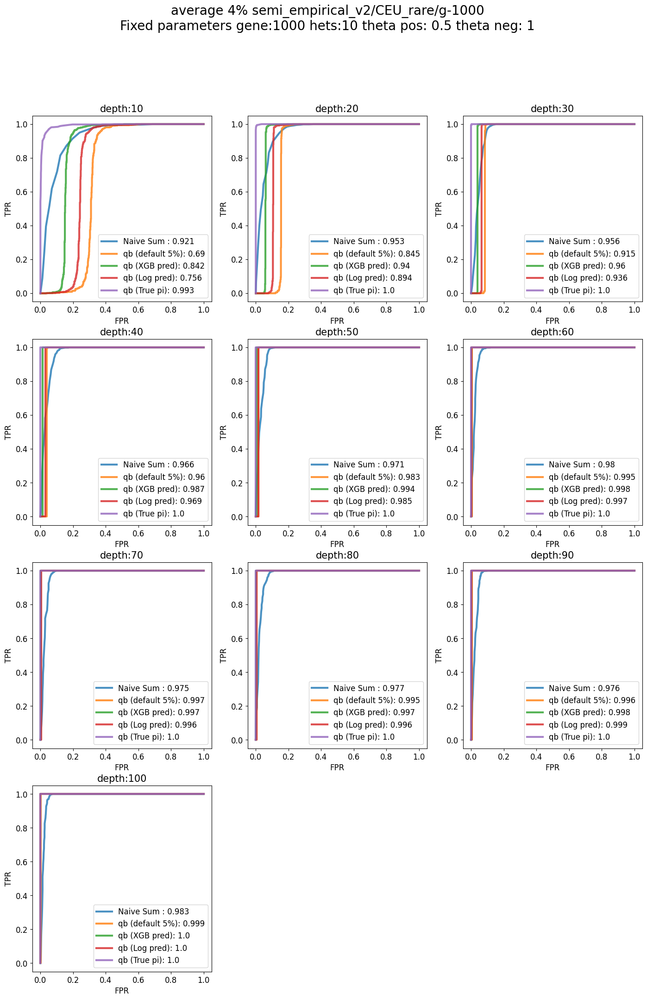

In [5]:
data_path="/data2/stan"
title="average 4%"
work_dir="semi_empirical_v2/CEU_rare/g-1000"
option="pval"
hets=10
depth=None
ROC_comparison_fix3_qb_MaxSite(data_path,work_dir,calculation=option,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_col=3)

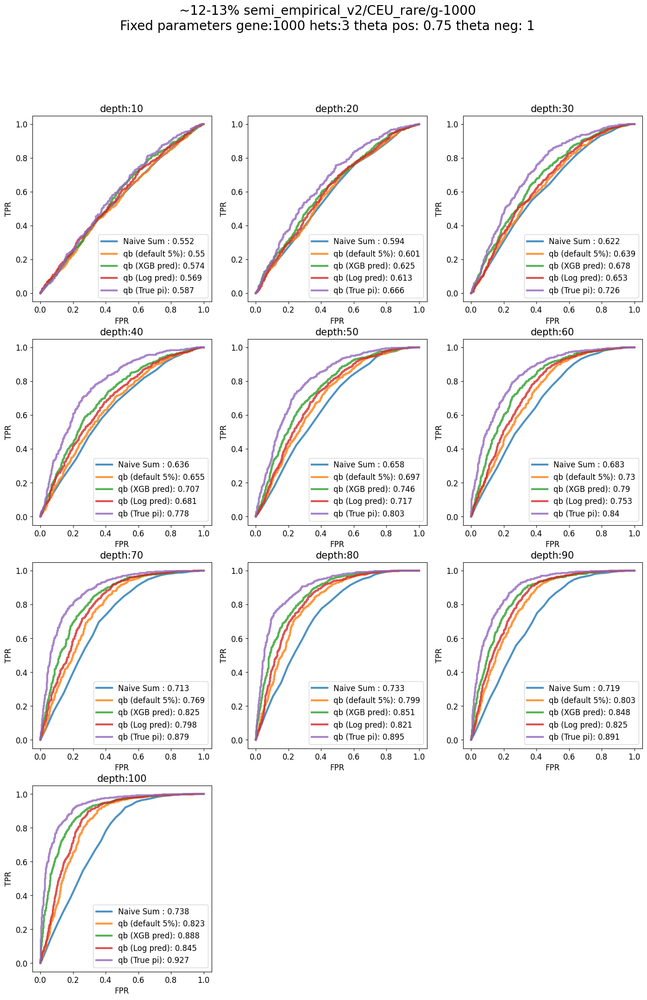

In [39]:
data_path="/data2/stan"
title="~12-13%"
work_dir="semi_empirical_v2/CEU_rare/g-1000"
option="pval"
hets=3
depth=None
ROC_comparison_fix3_qb_MaxSite(data_path,work_dir,calculation=option,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_col=3)

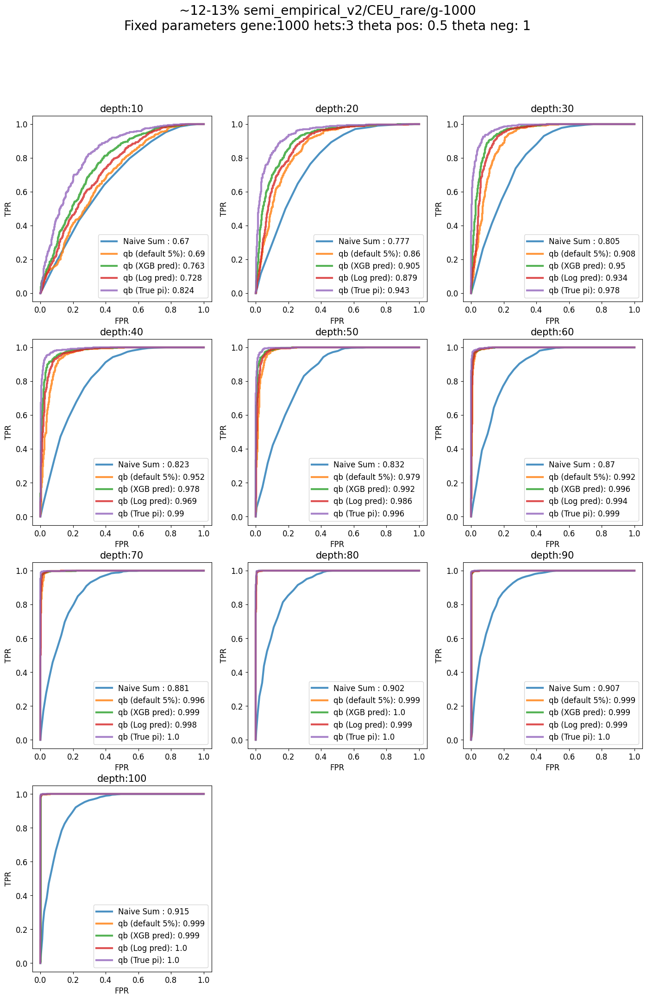

In [38]:
data_path="/data2/stan"
title="~12-13%"
work_dir="semi_empirical_v2/CEU_rare/g-1000"
option="pval"
hets=3
depth=None
ROC_comparison_fix3_qb_MaxSite(data_path,work_dir,calculation=option,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_col=3)

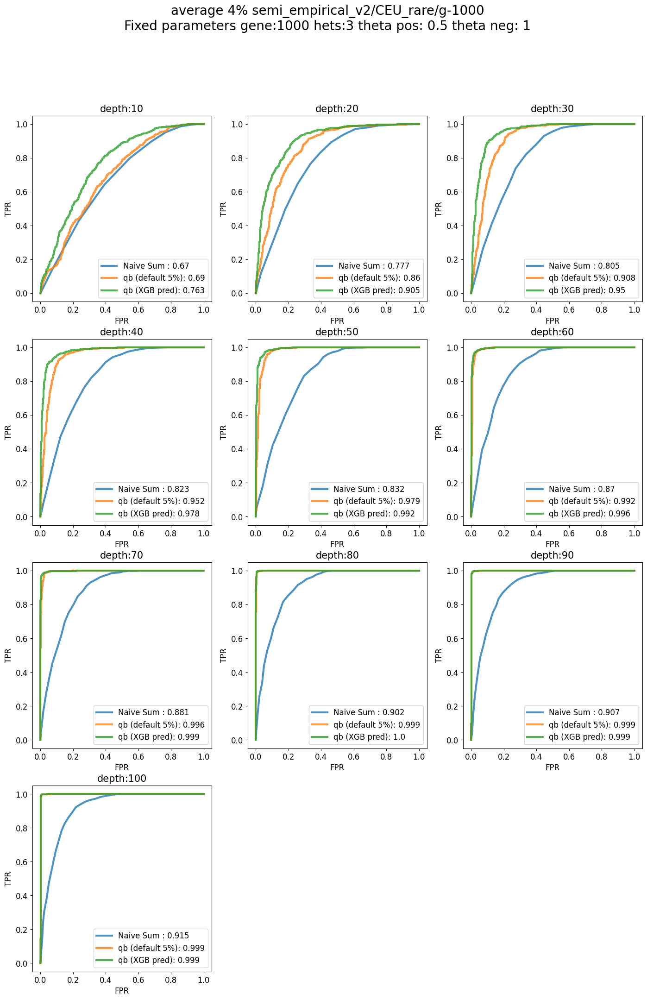

In [31]:
data_path="/data2/stan"
title="~12-13%"
work_dir="semi_empirical_v2/CEU_rare/g-1000"
option="pval"
hets=3
depth=None
ROC_comparison_fix3_qb_MaxSite(data_path,work_dir,calculation=option,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_col=3)

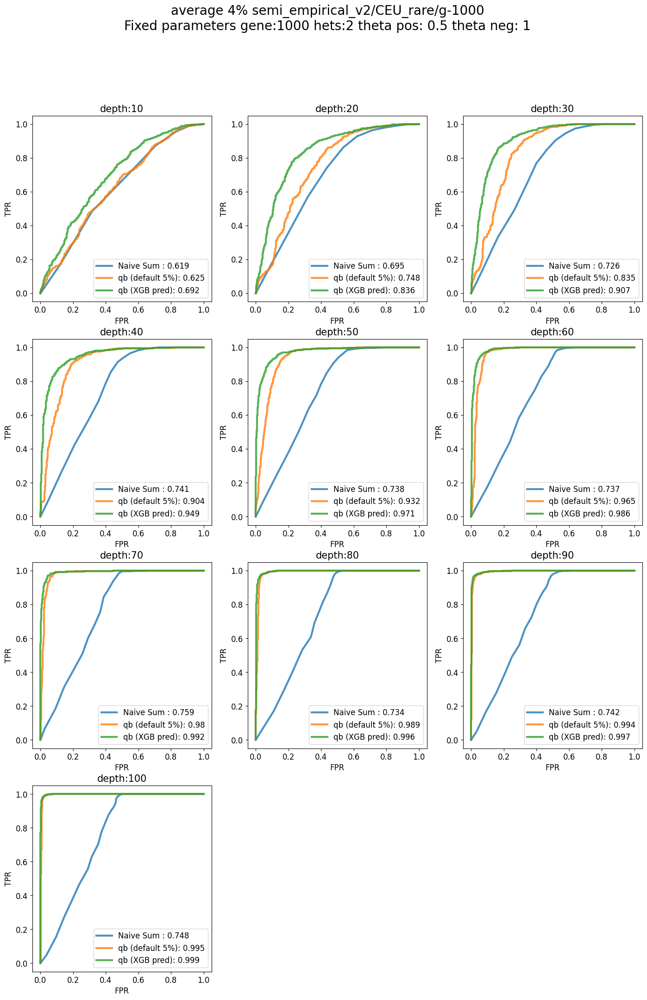

In [32]:
data_path="/data2/stan"
title="average 4%"
work_dir="semi_empirical_v2/CEU_rare/g-1000"
option="pval"
hets=2
depth=None
ROC_comparison_fix3_qb_MaxSite(data_path,work_dir,calculation=option,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_col=3)

In [40]:
data_path="/data2/stan"
title="average 4%"
work_dir="semi_empirical_v2/CEU_rare/g-1000"
option="pval"
hets=None
depth=30
ROC_comparison_fix3_qb_MaxSite(data_path,work_dir,calculation=option,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_col=3)

ValueError: not enough values to unpack (expected 2, got 1)

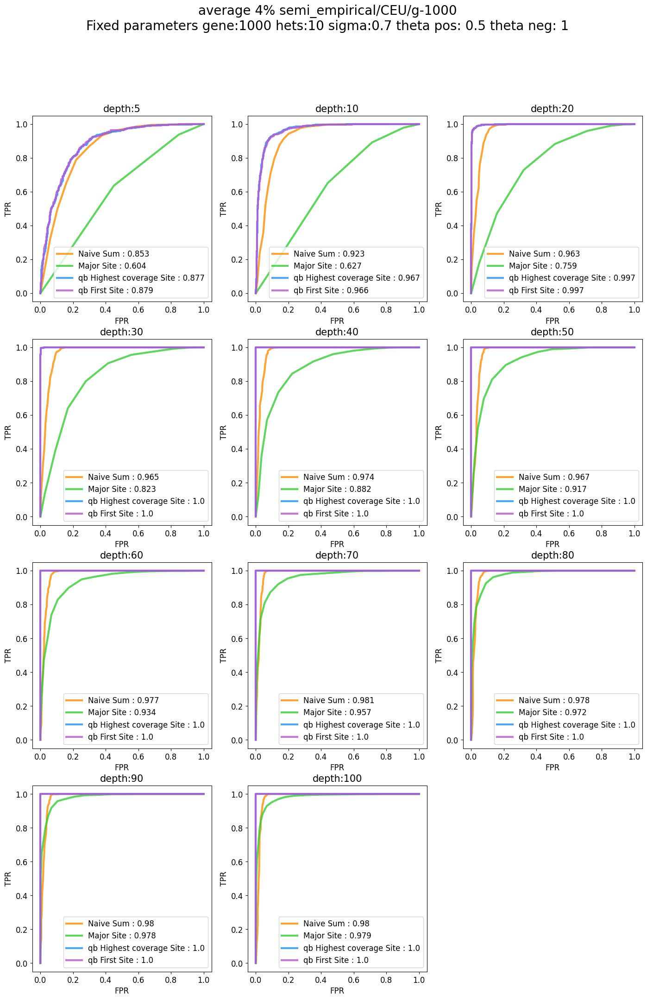

In [44]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="average 4%"
work_dir="semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb_firstSite(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

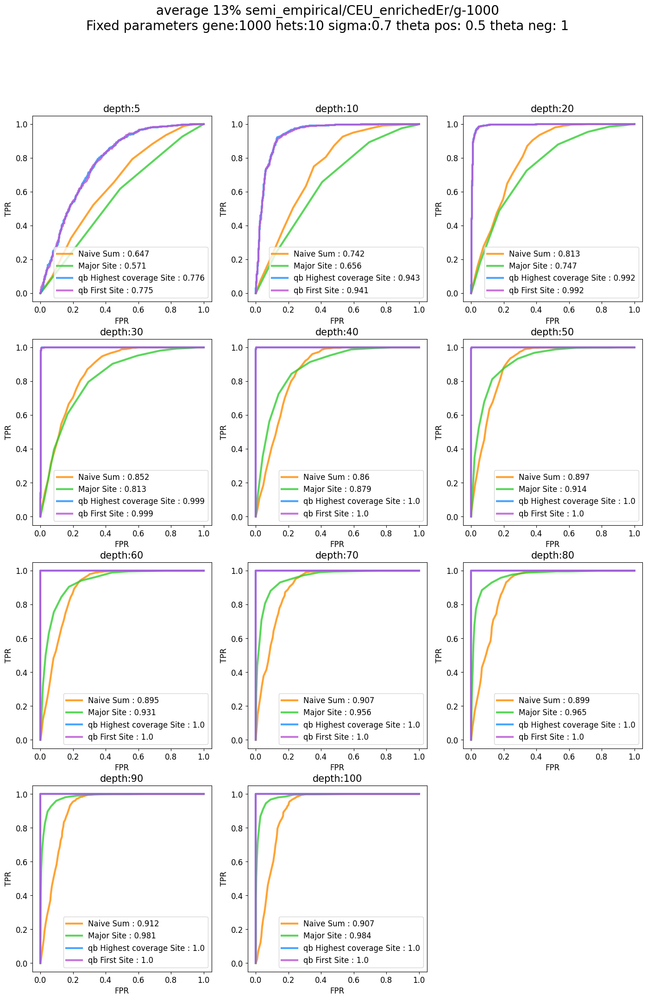

In [43]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="average 13%"
work_dir="semi_empirical/CEU_enrichedEr/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb_firstSite(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

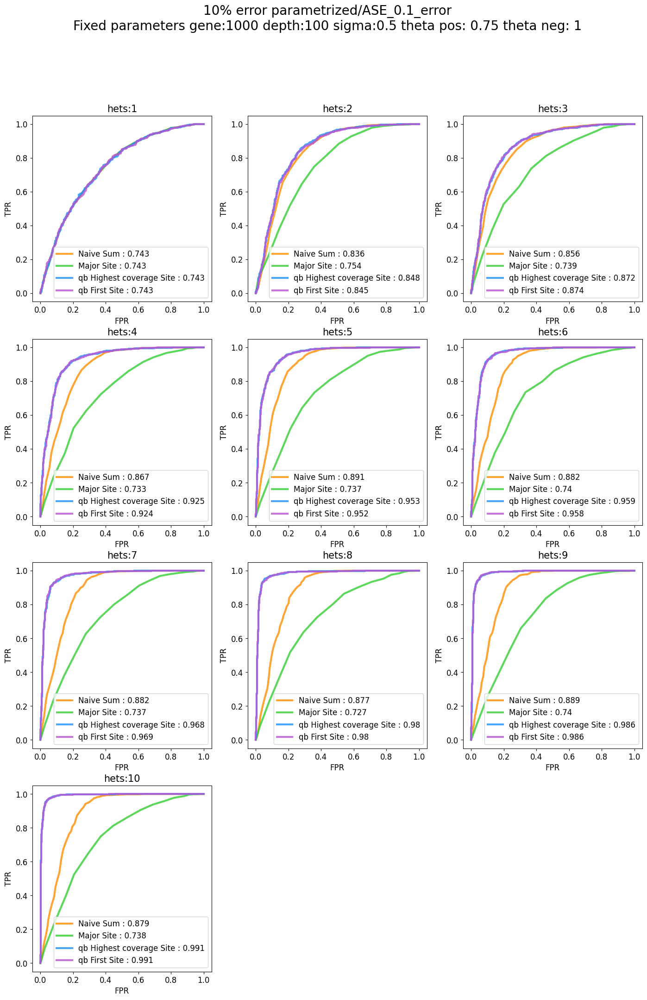

In [8]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.5
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=None
depth=100
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb_firstSite(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

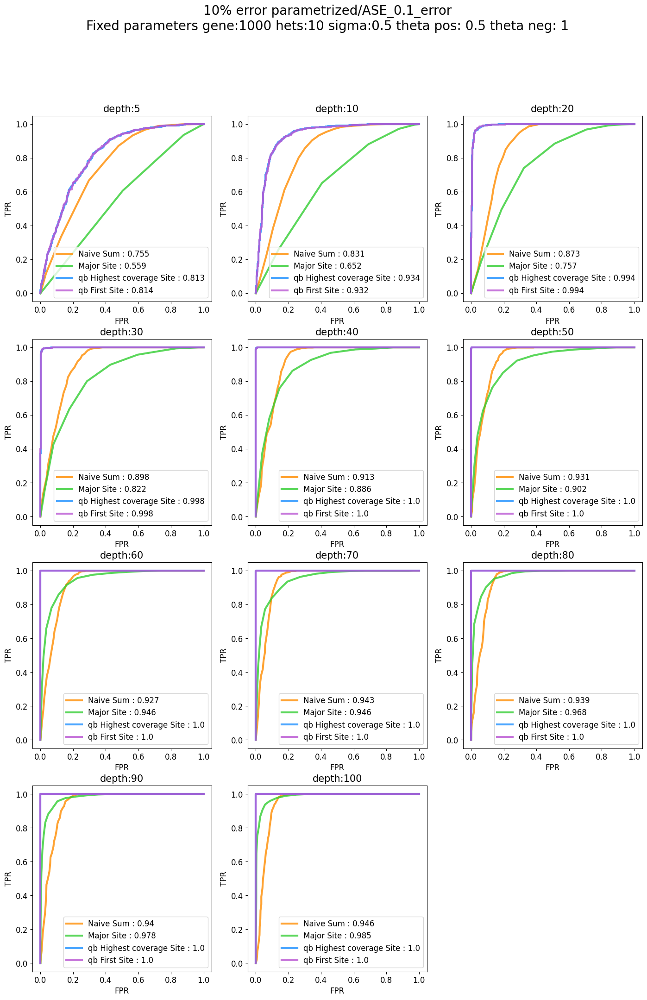

In [9]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.5
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb_firstSite(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

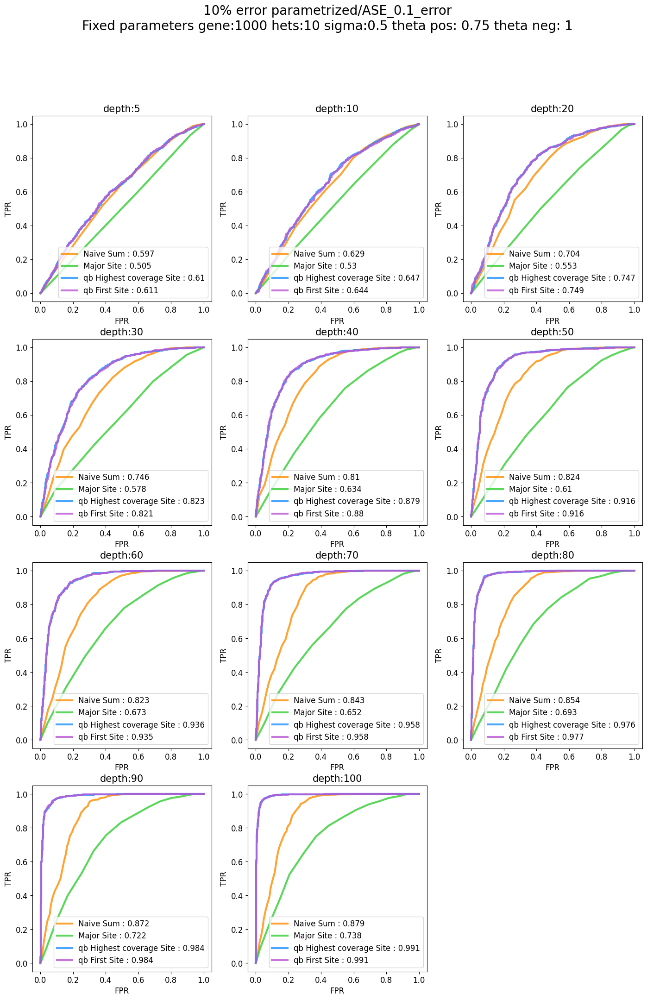

In [11]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.5
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb_firstSite(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

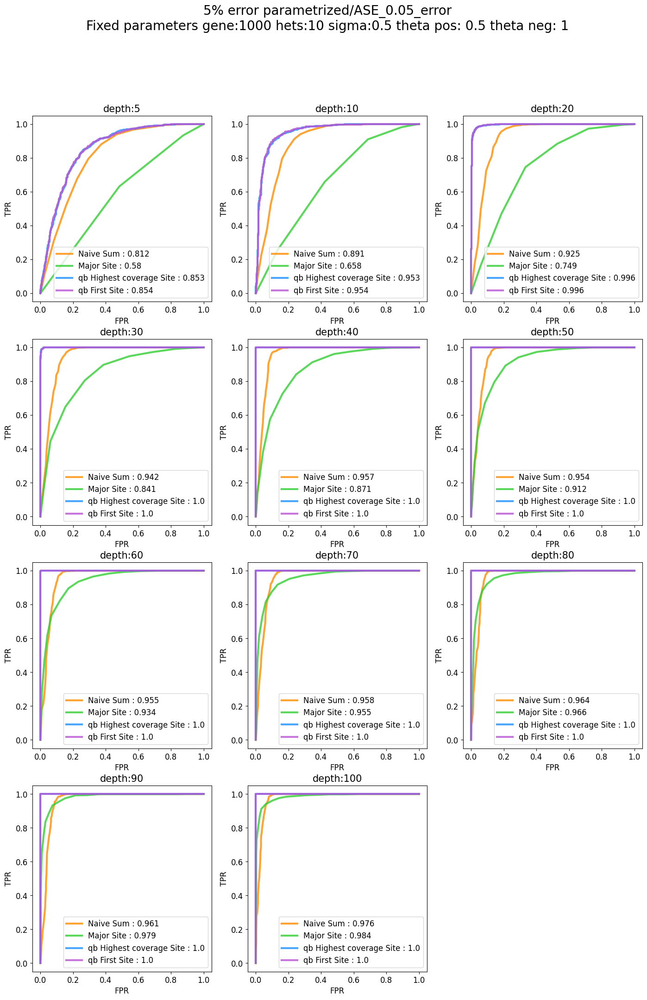

In [10]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.5
title="5% error"
work_dir="parametrized/ASE_0.05_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb_firstSite(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

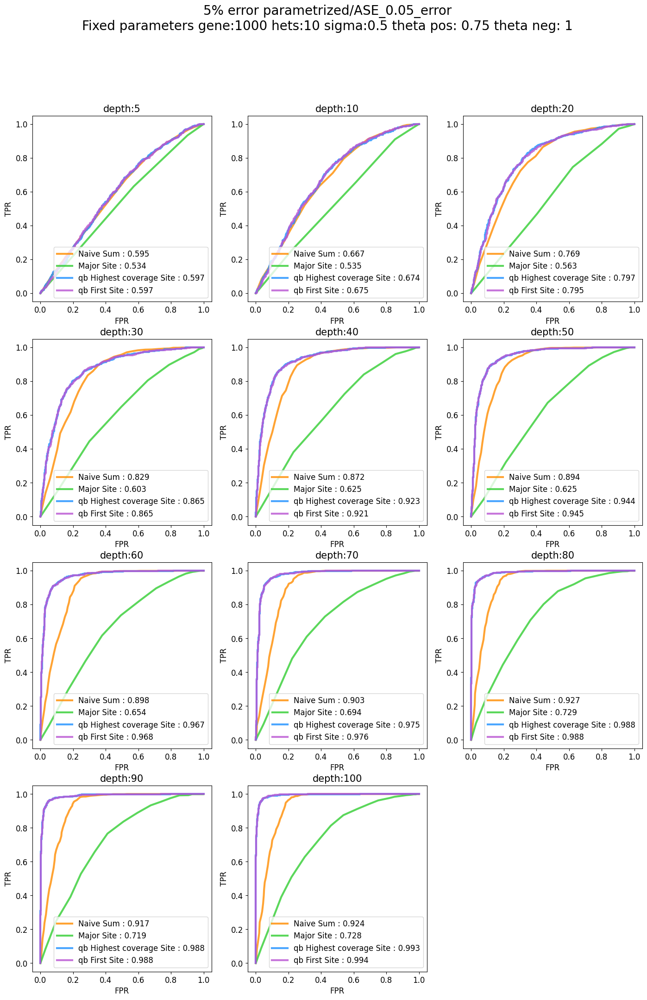

In [12]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.5
title="5% error"
work_dir="parametrized/ASE_0.05_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb_firstSite(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

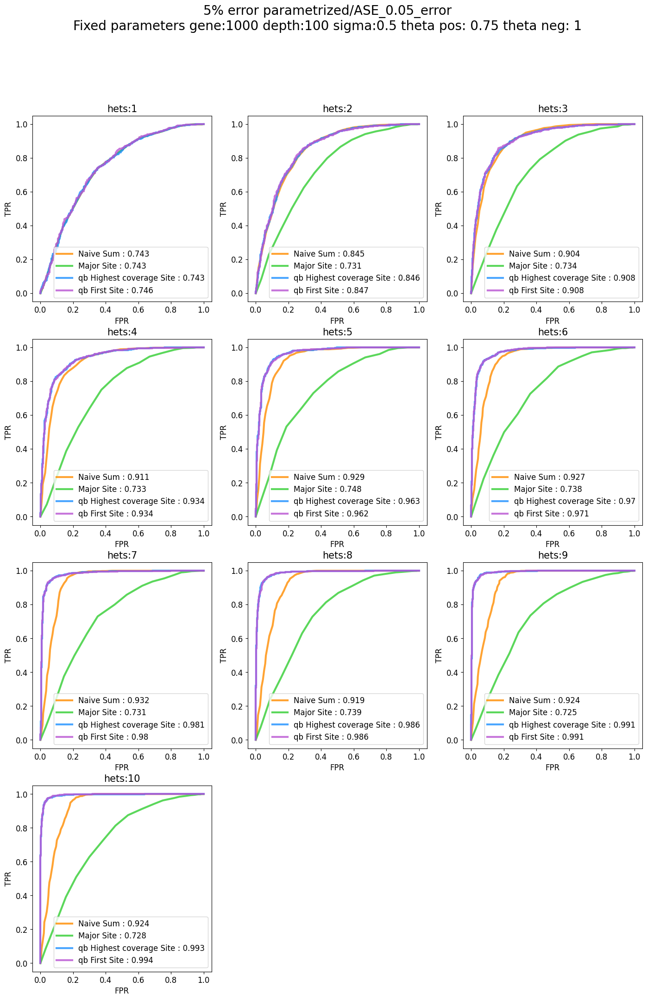

In [13]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.5
title="5% error"
work_dir="parametrized/ASE_0.05_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=None
depth=100
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb_firstSite(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

## model comparison on semi empirical data

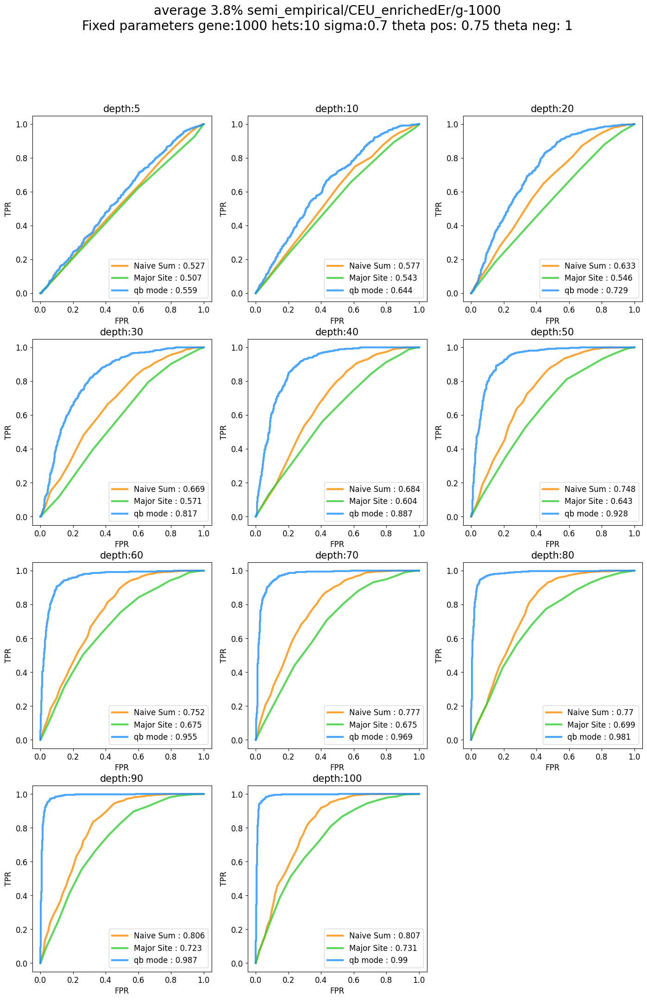

In [58]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="average 12%"
work_dir="semi_empirical/CEU_enrichedEr/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

['g-1000', 'h-10', 'd-100', 't-0.5', 's-0.7']
['g-1000', 'h-10', 'd-100', 't-0.75', 's-0.7']
['g-1000', 'h-10', 'd-100', 't-1', 's-0.7']
['g-1000', 'h-10', 'd-10', 't-0.5', 's-0.7']
['g-1000', 'h-10', 'd-10', 't-0.75', 's-0.7']
['g-1000', 'h-10', 'd-10', 't-1', 's-0.7']
['g-1000', 'h-10', 'd-20', 't-0.5', 's-0.7']
['g-1000', 'h-10', 'd-20', 't-0.75', 's-0.7']
['g-1000', 'h-10', 'd-20', 't-1', 's-0.7']
['g-1000', 'h-10', 'd-30', 't-0.5', 's-0.7']
['g-1000', 'h-10', 'd-30', 't-0.75', 's-0.7']
['g-1000', 'h-10', 'd-30', 't-1', 's-0.7']
['g-1000', 'h-10', 'd-40', 't-0.5', 's-0.7']
['g-1000', 'h-10', 'd-40', 't-0.75', 's-0.7']
['g-1000', 'h-10', 'd-40', 't-1', 's-0.7']
['g-1000', 'h-10', 'd-50', 't-0.5', 's-0.7']
['g-1000', 'h-10', 'd-50', 't-0.75', 's-0.7']
['g-1000', 'h-10', 'd-50', 't-1', 's-0.7']
['g-1000', 'h-10', 'd-5', 't-0.5', 's-0.7']
['g-1000', 'h-10', 'd-5', 't-0.75', 's-0.7']
['g-1000', 'h-10', 'd-5', 't-1', 's-0.7']
['g-1000', 'h-10', 'd-60', 't-0.5', 's-0.7']
['g-1000', 'h-10'

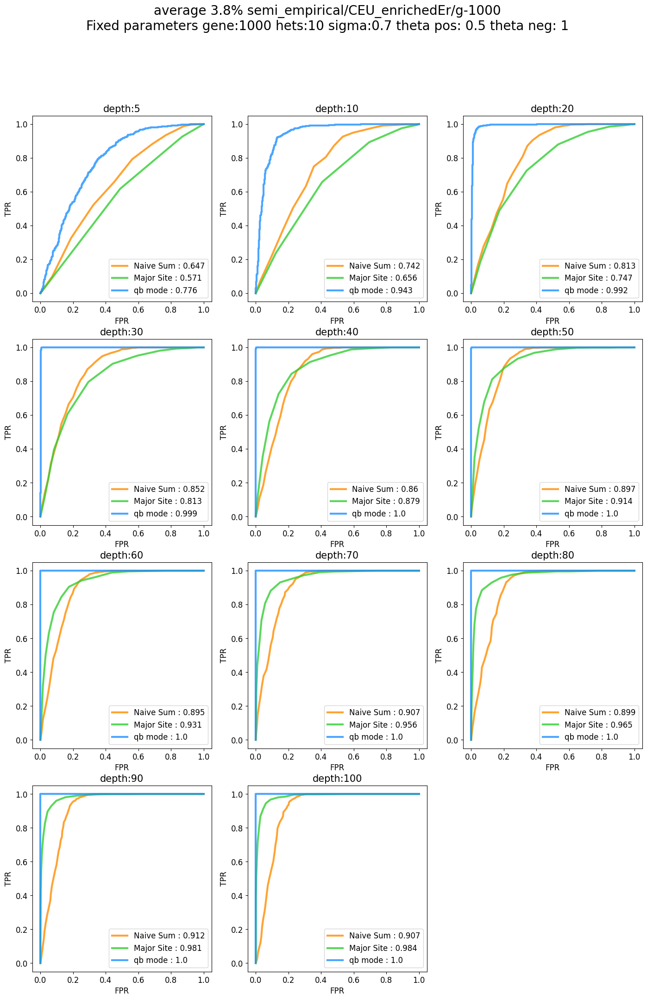

In [22]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="average 3.8%"
work_dir="semi_empirical/CEU_enrichedEr/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

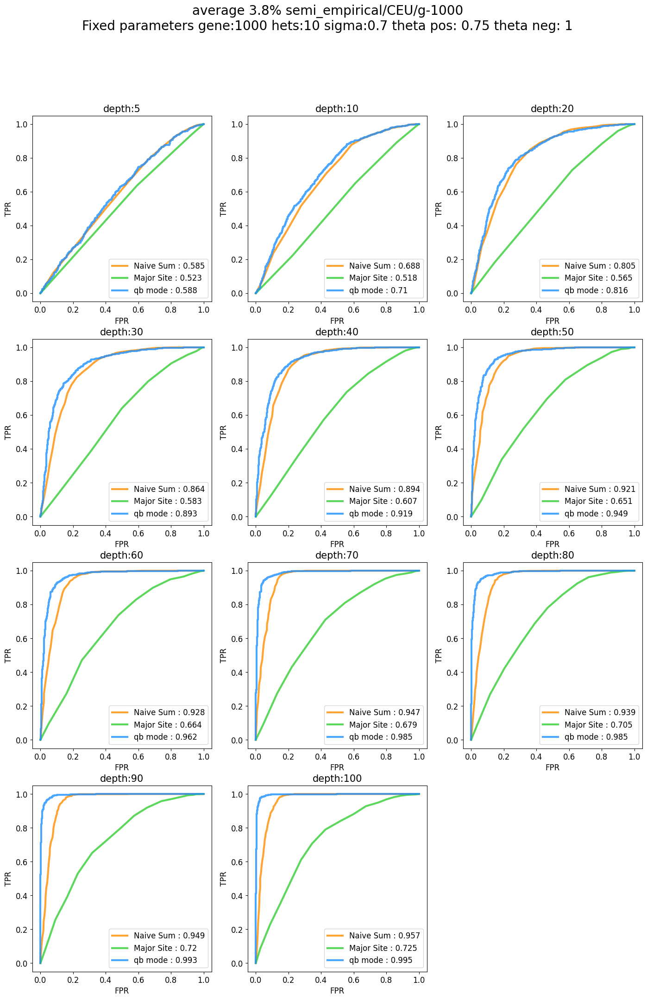

In [60]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="average 3.8%"
work_dir="semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

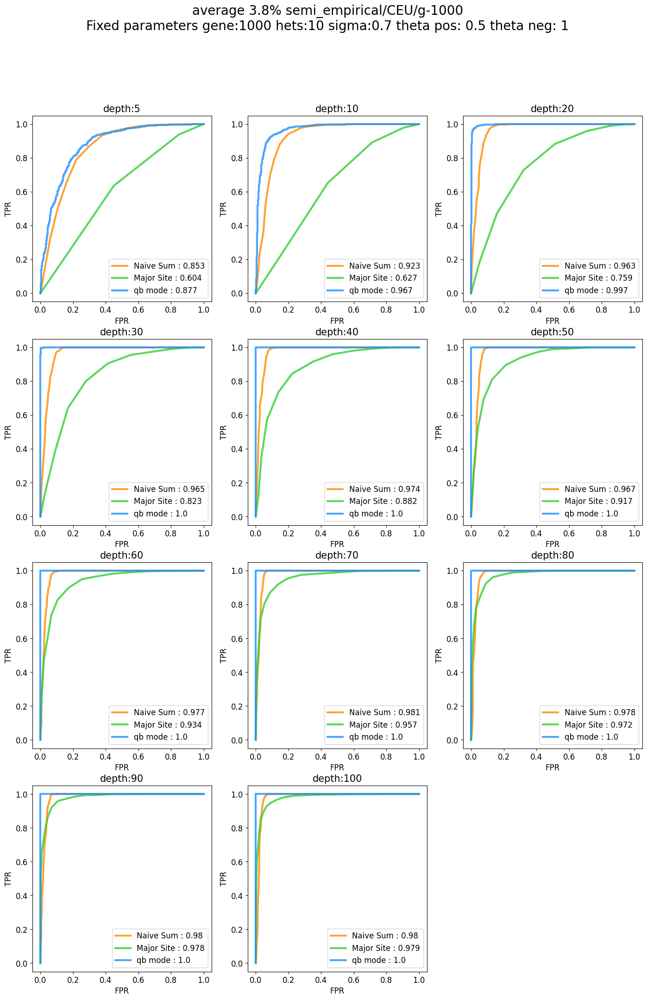

In [6]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="average 3.8%"
work_dir="semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

# simulation data

## 0% error

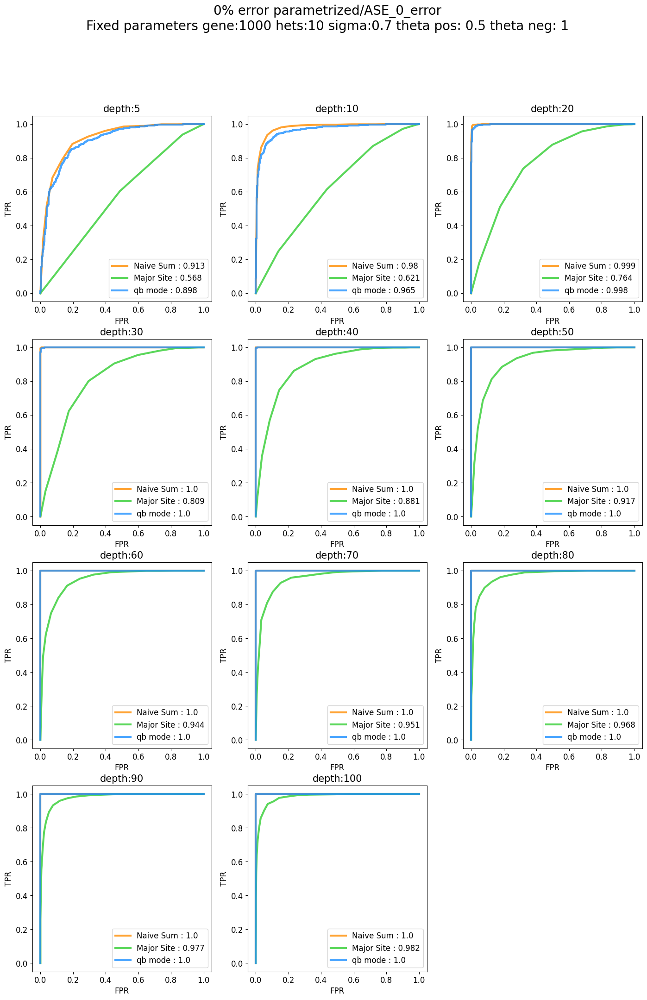

In [49]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

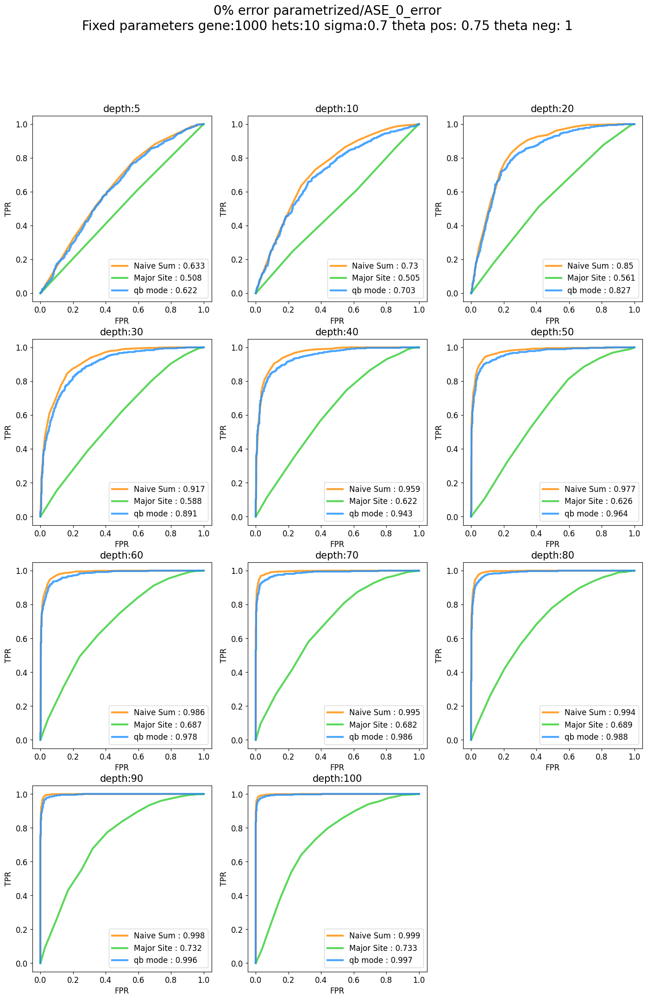

In [50]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

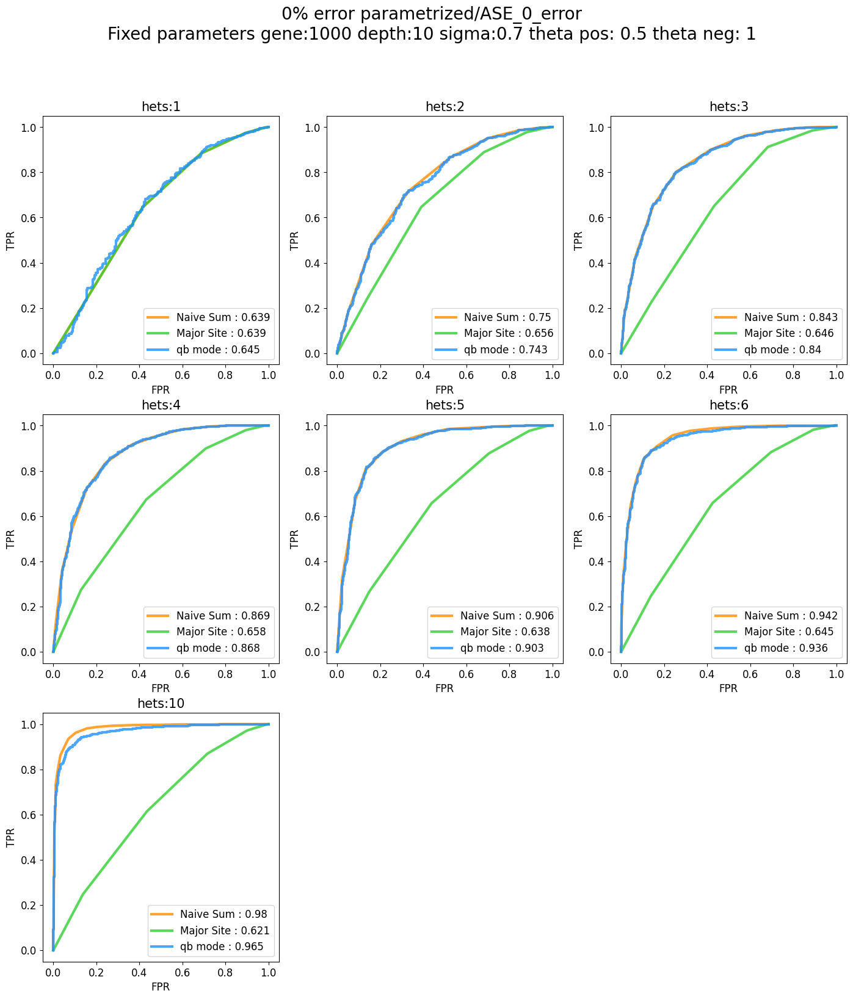

In [51]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=None
depth=10
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

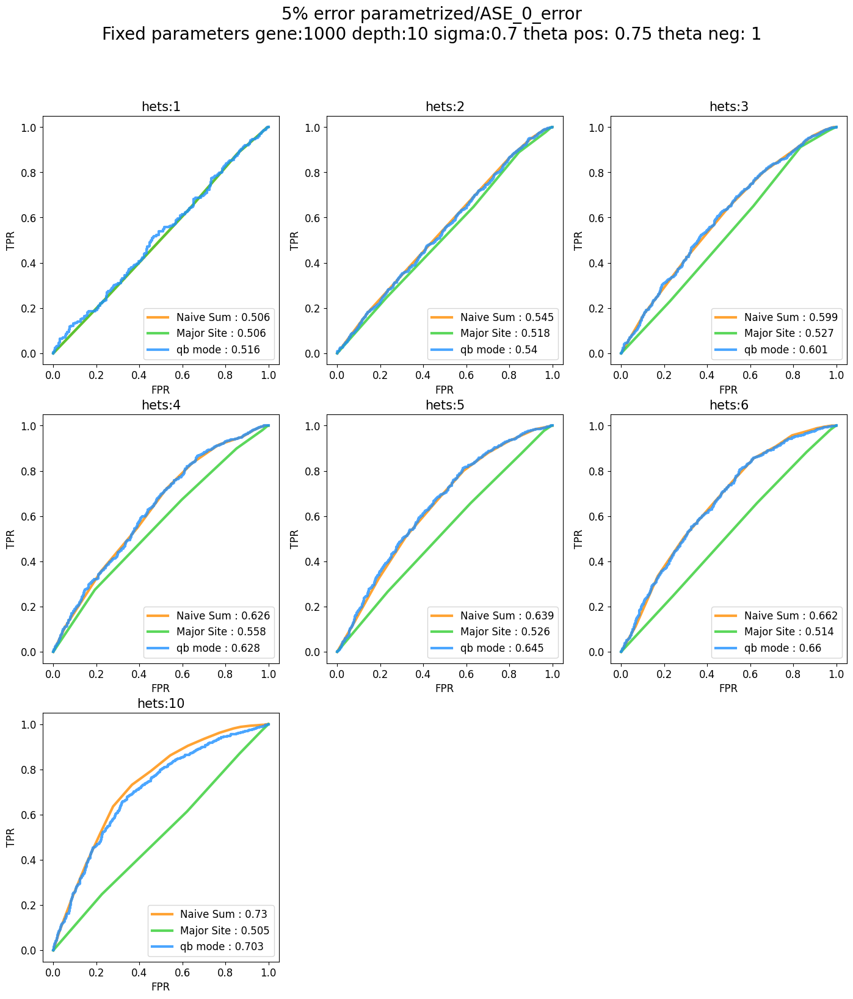

In [52]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="5% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=None
depth=10
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

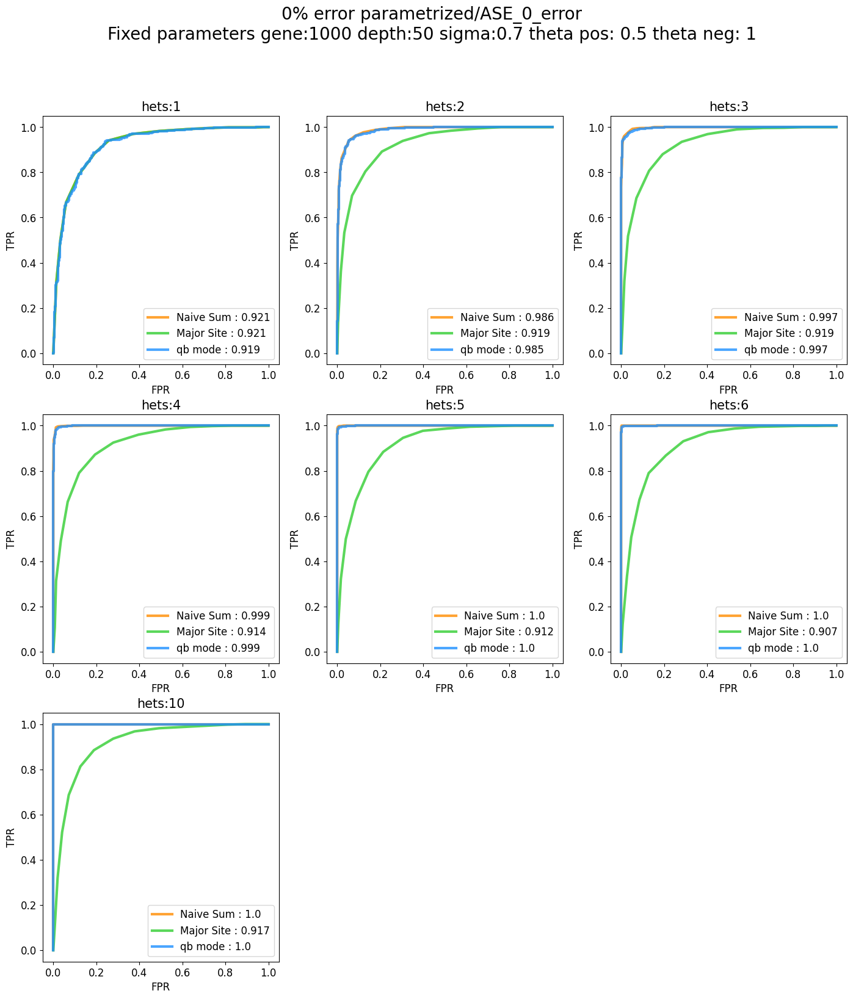

In [53]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=None
depth=50
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

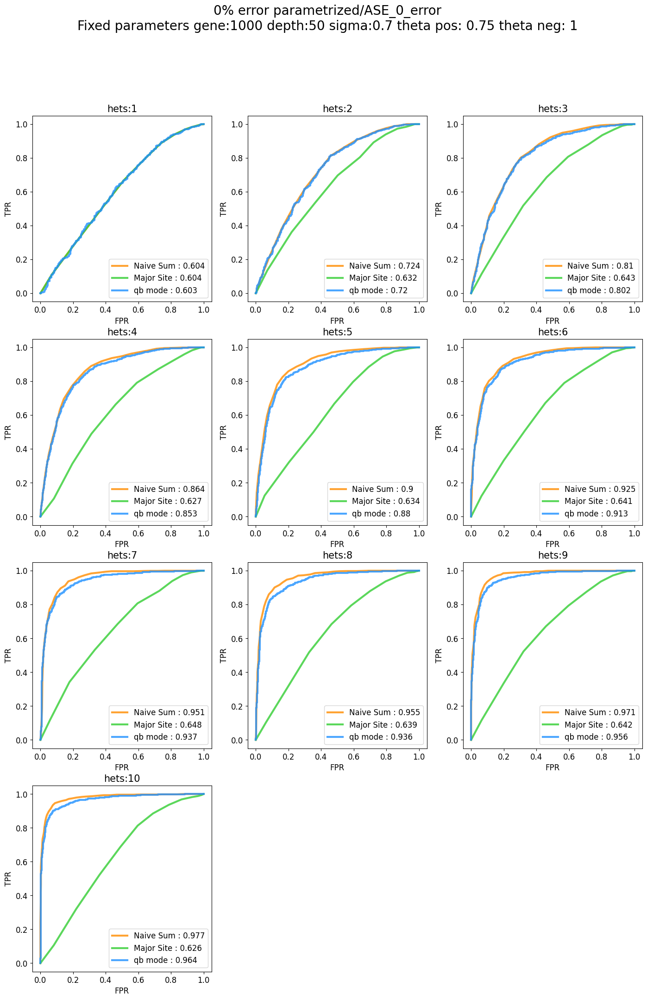

In [54]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=None
depth=50
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

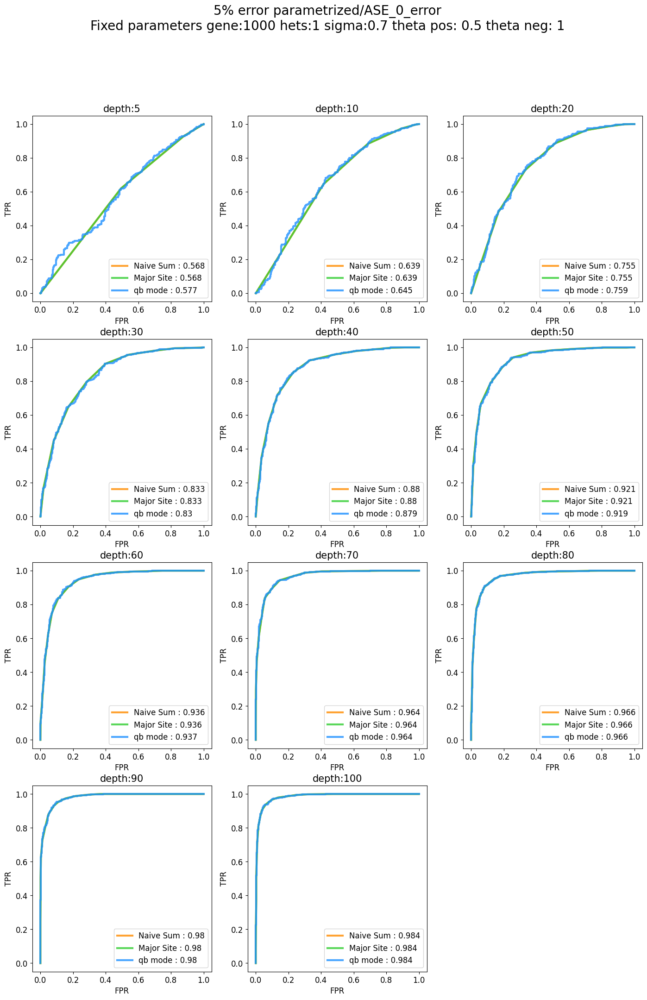

In [55]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="5% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=1
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

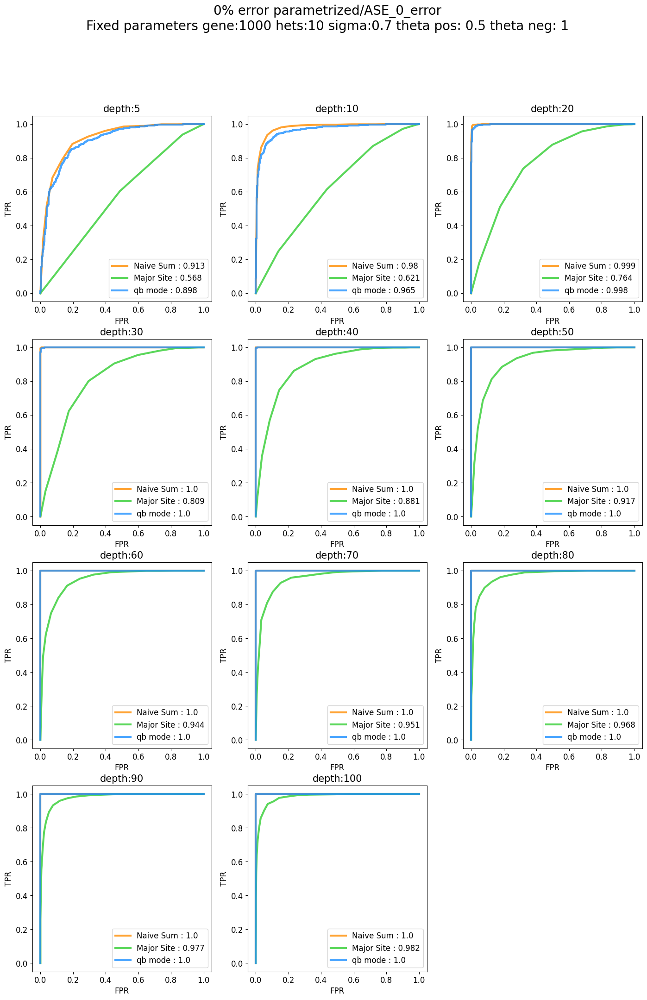

In [56]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

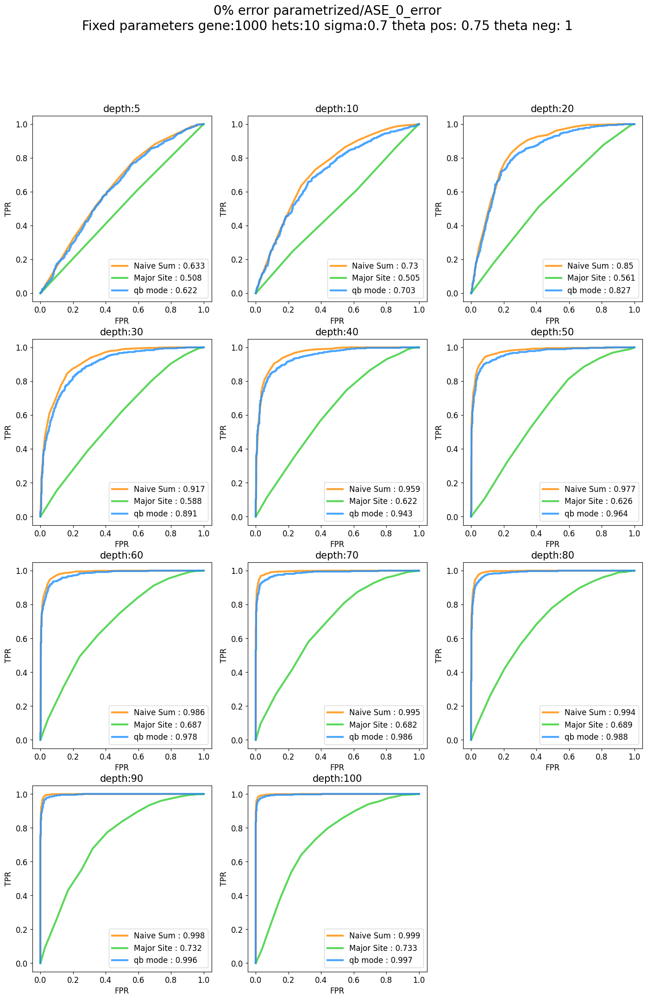

In [57]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

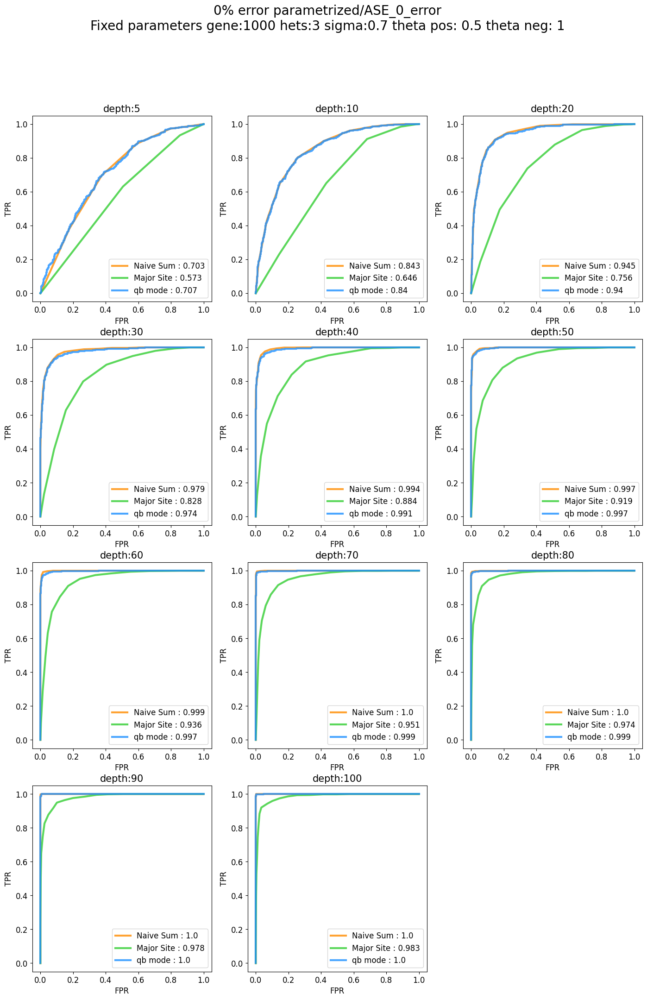

In [58]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=3
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

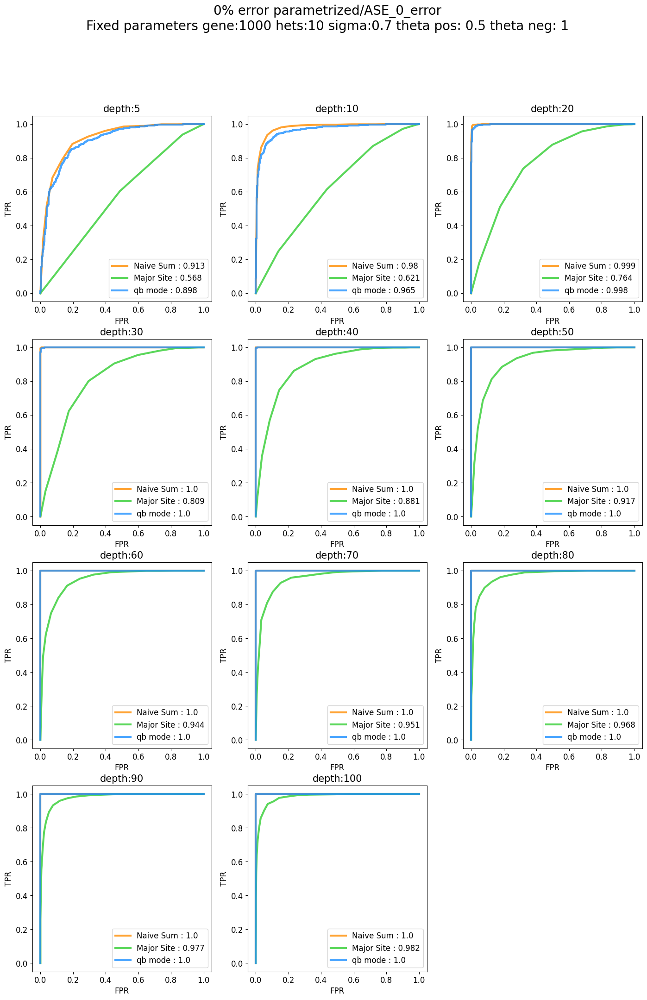

In [59]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

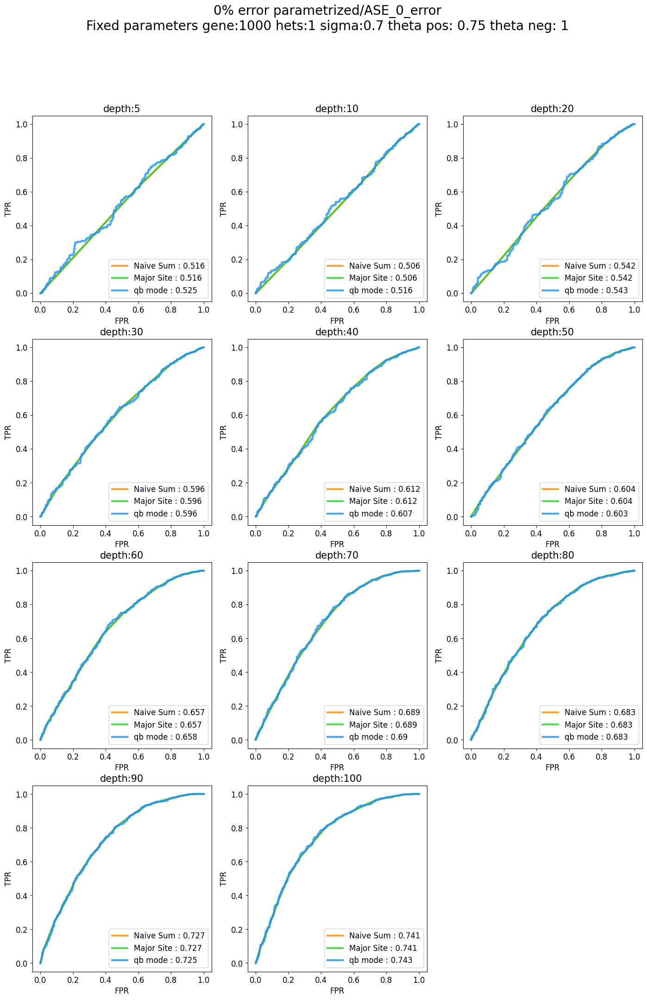

In [60]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=1
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

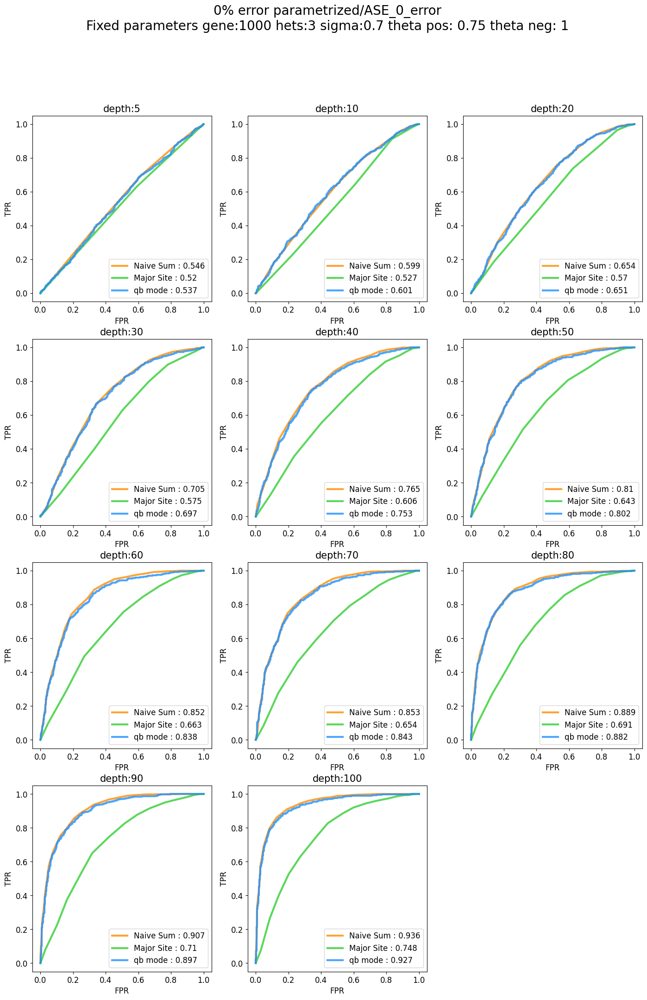

In [61]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=3
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

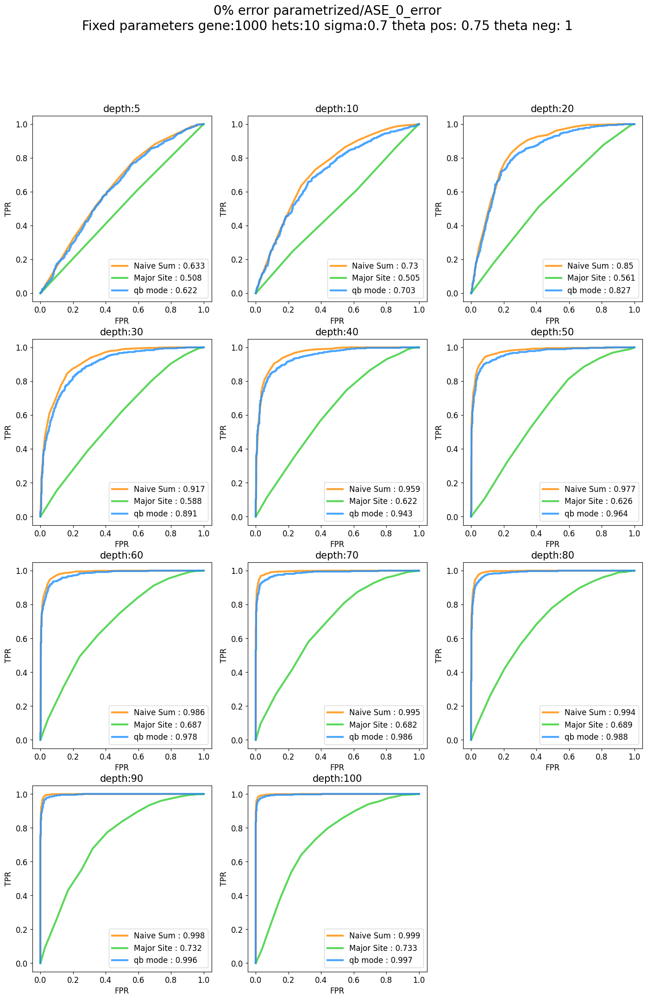

In [62]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="0% error"
work_dir="parametrized/ASE_0_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

## 5% error

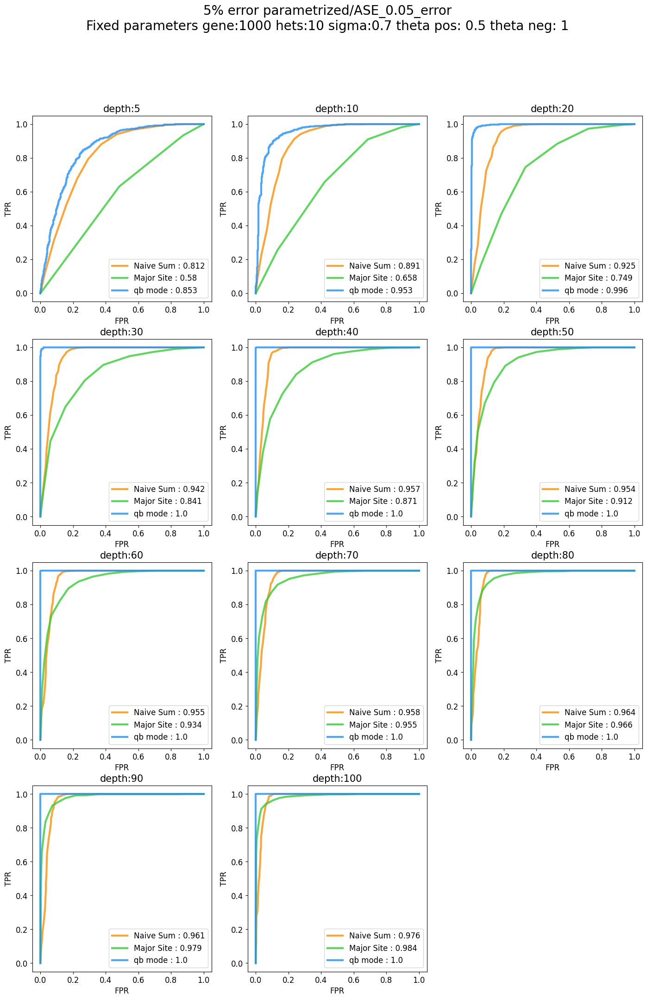

In [63]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="5% error"
work_dir="parametrized/ASE_0.05_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

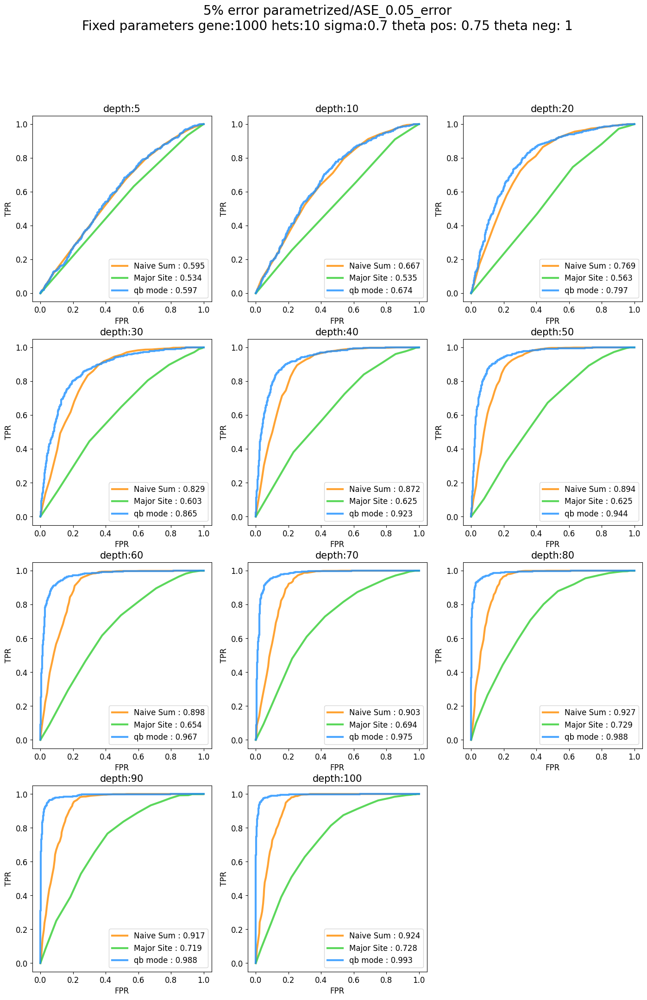

In [64]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="5% error"
work_dir="parametrized/ASE_0.05_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

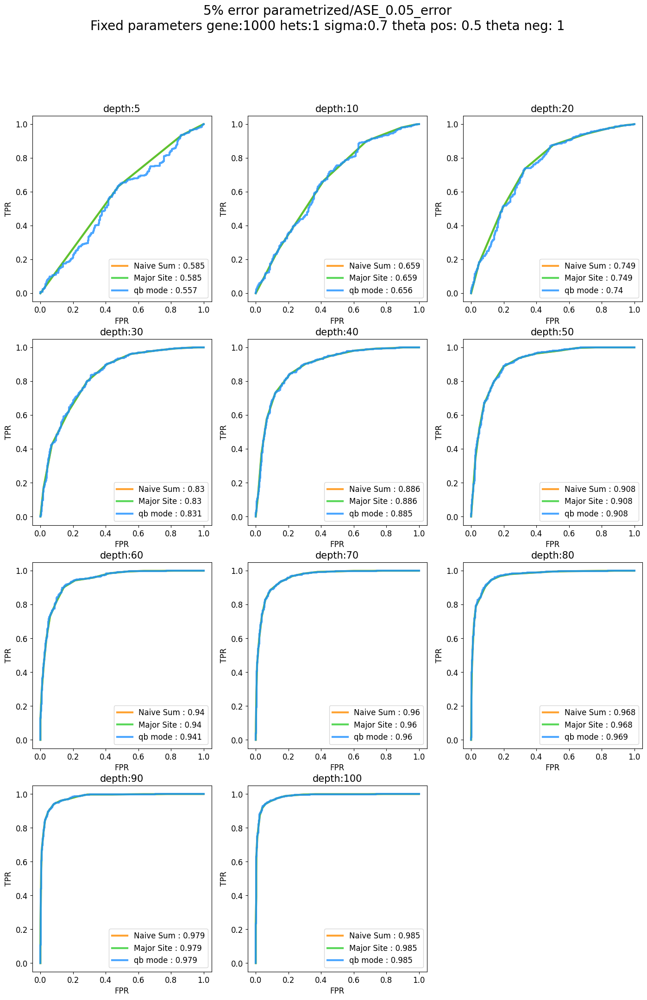

In [65]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="5% error"
work_dir="parametrized/ASE_0.05_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=1
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

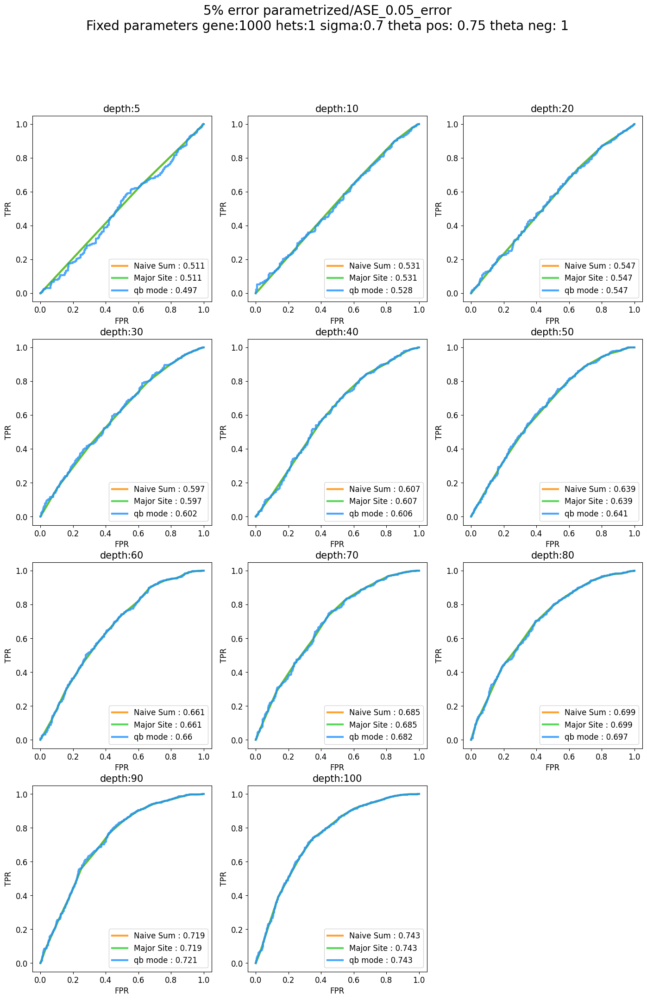

In [67]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="5% error"
work_dir="parametrized/ASE_0.05_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=1
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

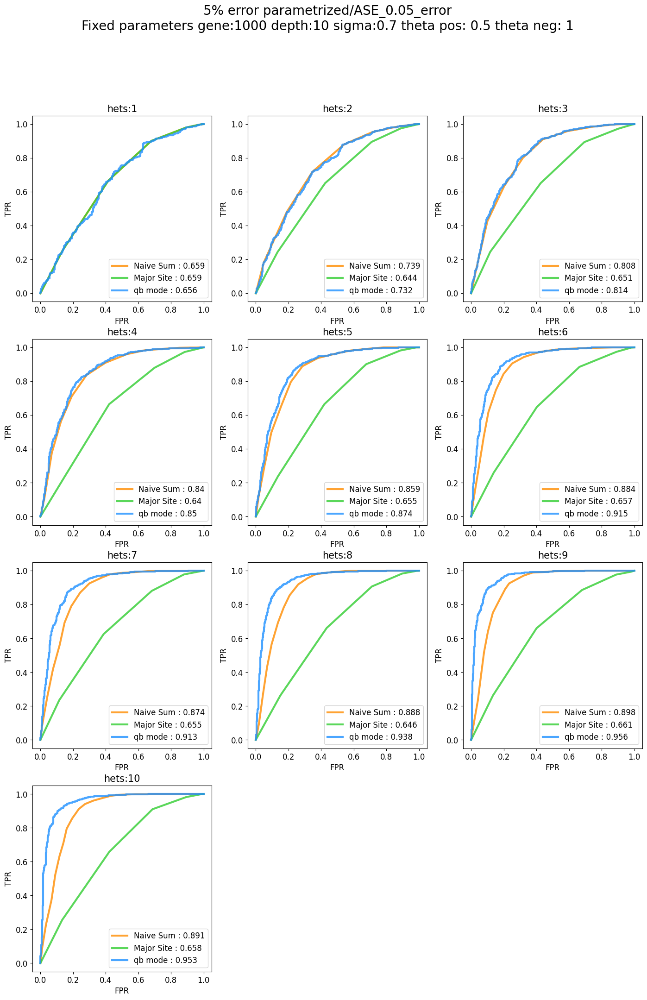

In [69]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="5% error"
work_dir="parametrized/ASE_0.05_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=None
depth=10
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

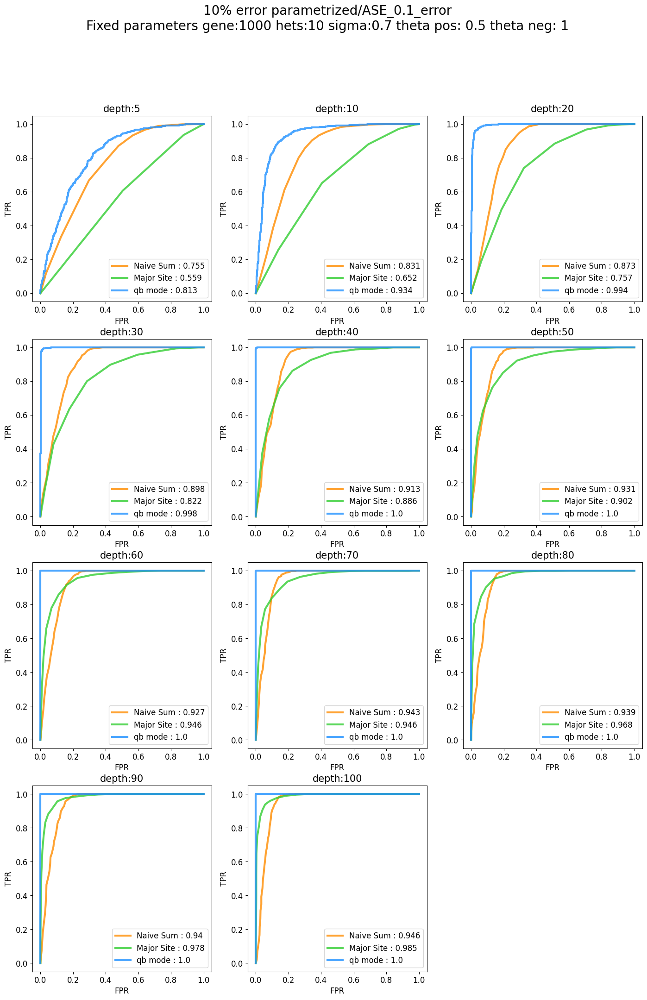

In [65]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

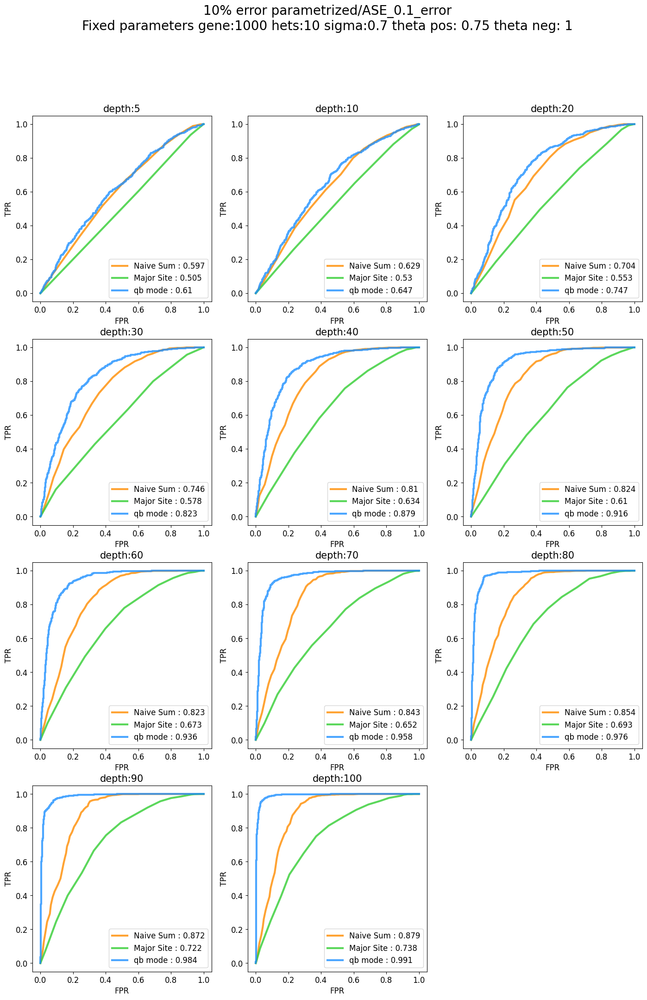

In [66]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

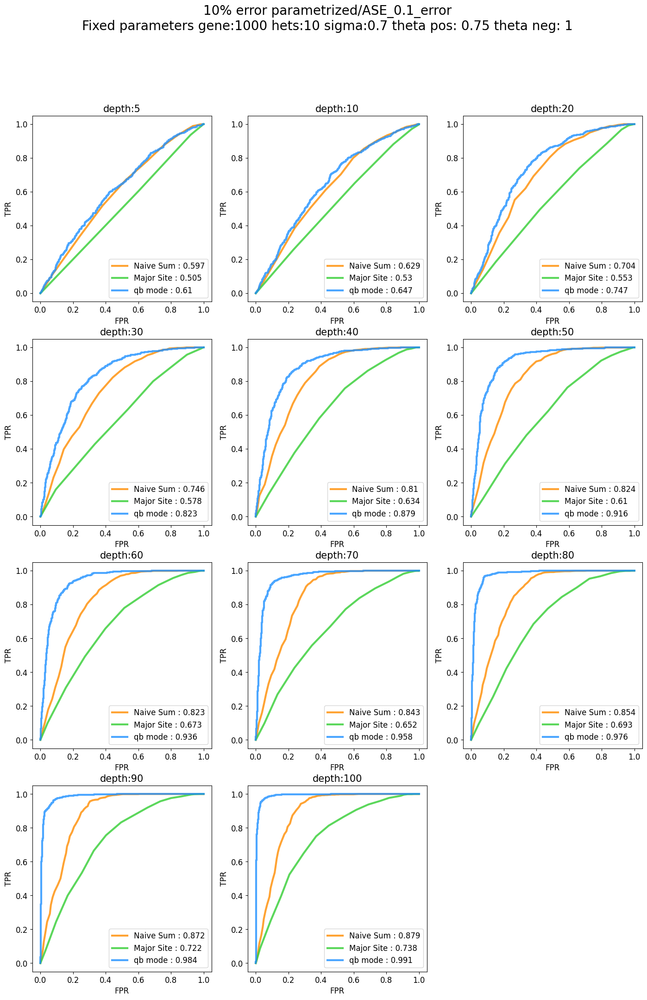

In [68]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

# 10%

FileNotFoundError: [Errno 2] No such file or directory: '/data2/stan/quickBEAST/a8.789625_b8.789625/lambda0.04545/parametrized/ASE_0.1_error//g-1000_h-10_d-5_t-0.75.txt'

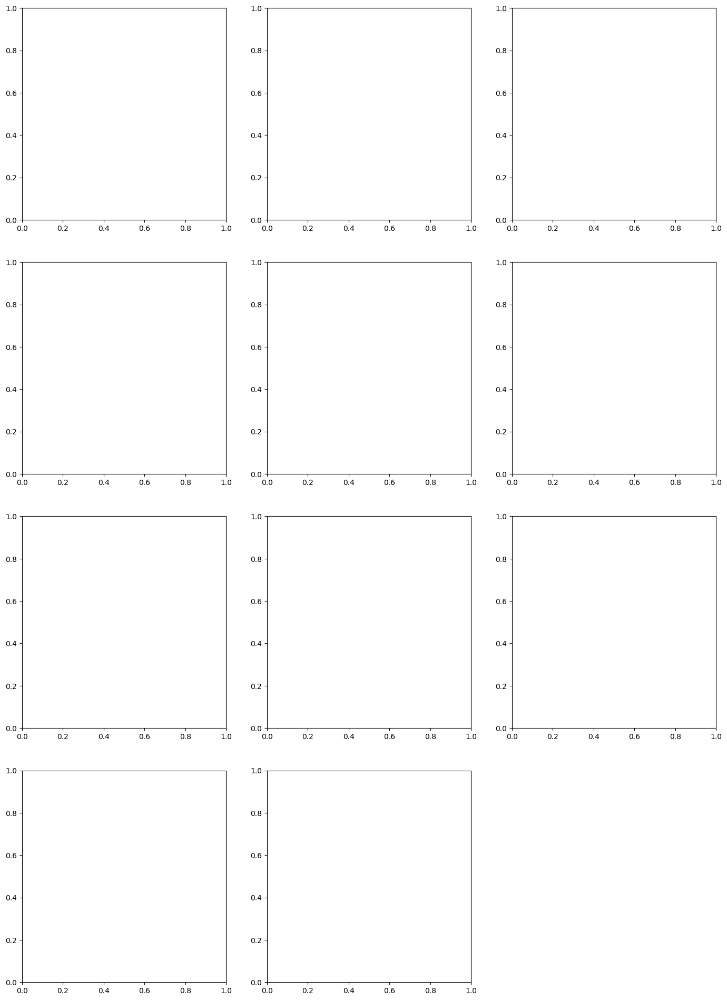

In [71]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

FileNotFoundError: [Errno 2] No such file or directory: '/data2/stan/quickBEAST/a8.789625_b8.789625/lambda0.04545/parametrized/ASE_0.1_error//g-1000_h-10_d-5_t-0.5.txt'

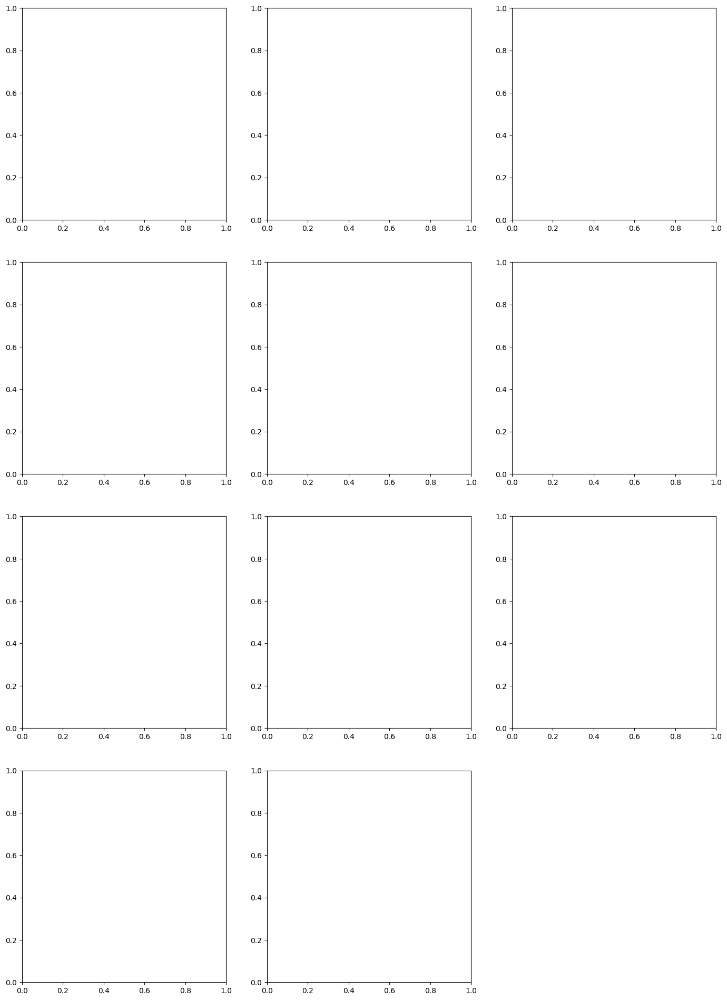

In [72]:
data_path="/data2/stan"
model="BEASTIE3-pi0.05"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

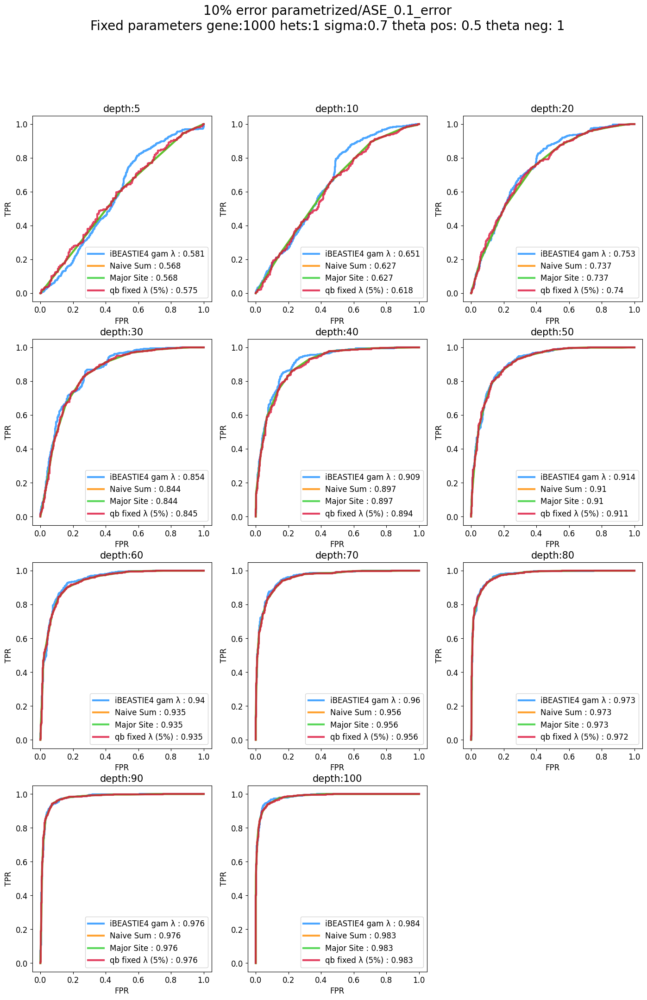

In [ ]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=1
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

FileNotFoundError: [Errno 2] No such file or directory: '/data2/stan/iBEASTIE4/sigma0.7/parametrized/ASE_0.1_error/output_pkl//g-1000_h-3_d-80_t-0.5_s-0.7.tsv'

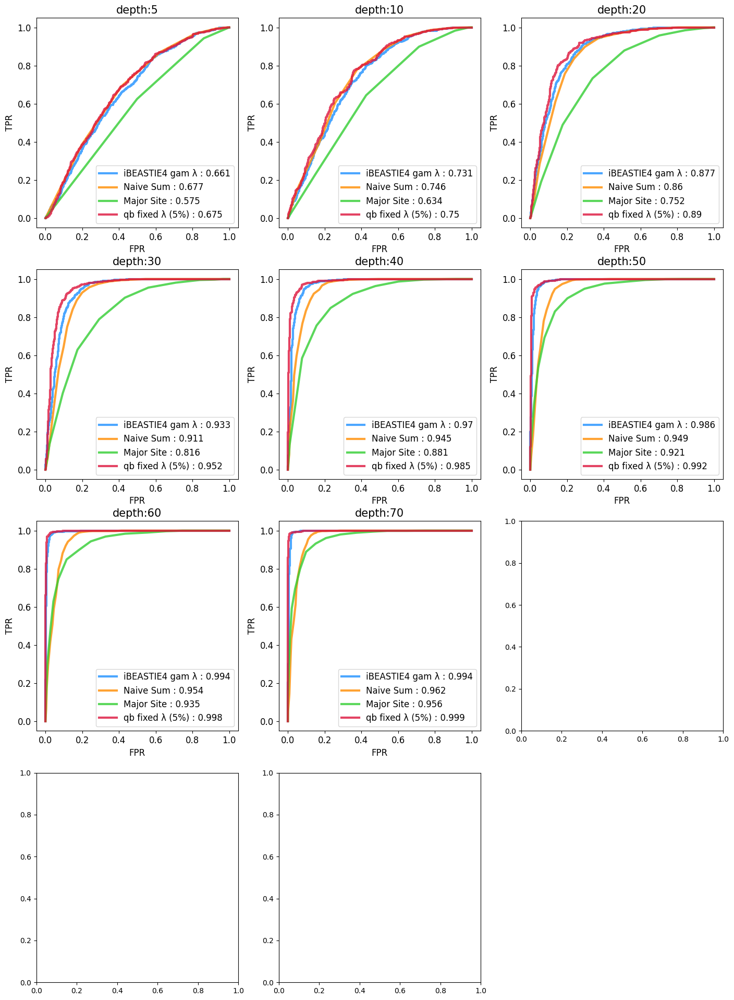

In [ ]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=3
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

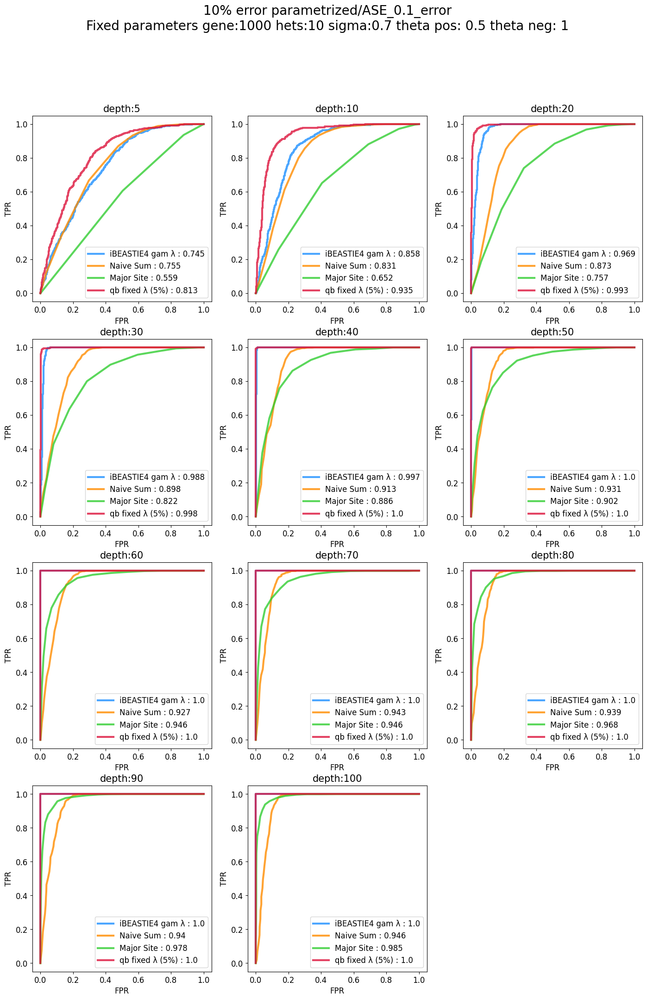

In [ ]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.5,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

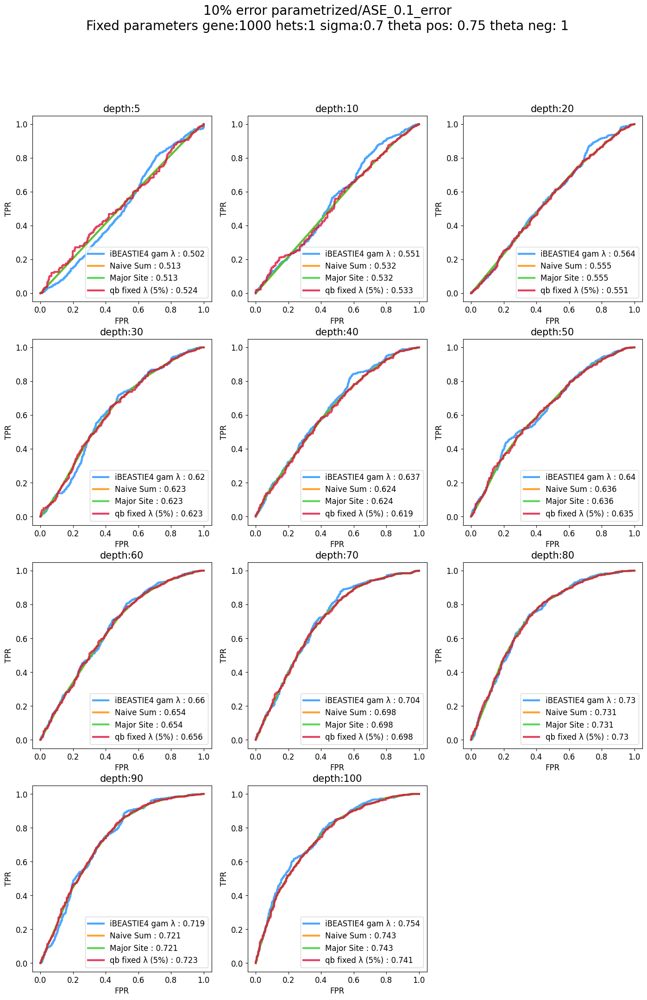

In [ ]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=1
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

FileNotFoundError: [Errno 2] No such file or directory: '/data2/stan/iBEASTIE4/sigma0.7/parametrized/ASE_0.1_error/output_pkl//g-1000_h-3_d-80_t-0.75_s-0.7.tsv'

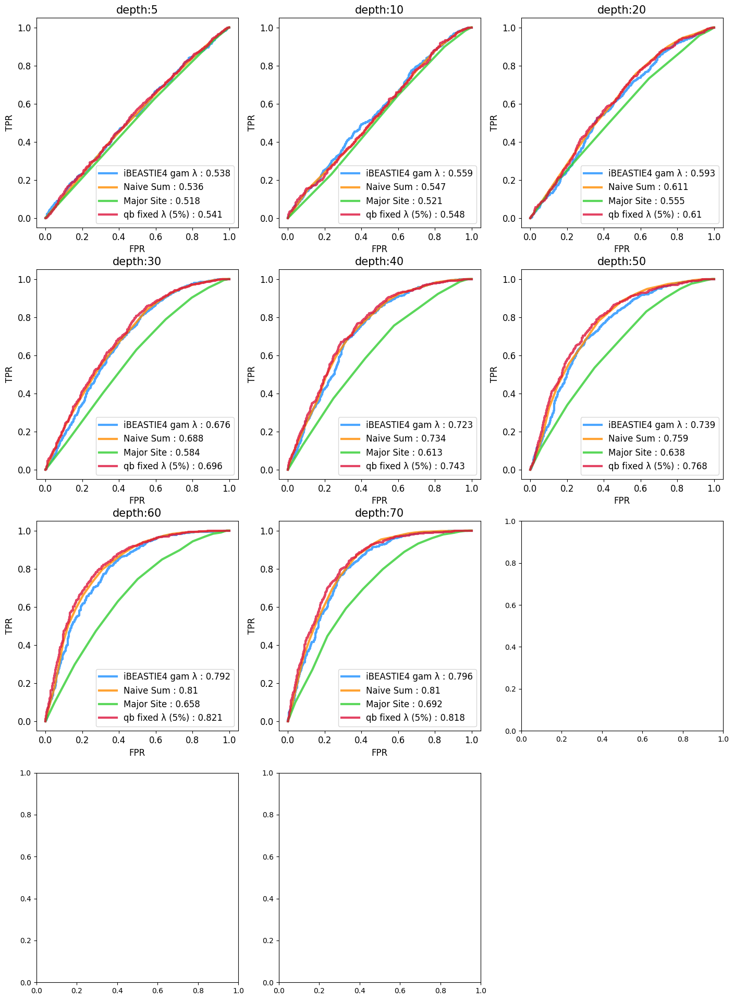

In [ ]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=3
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)

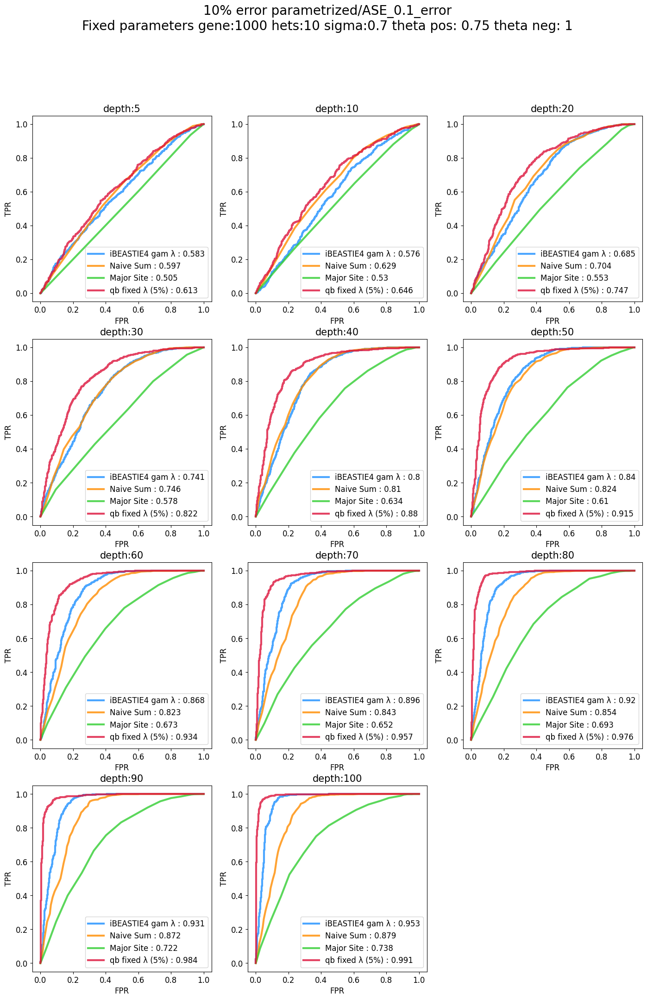

In [ ]:
data_path="/data2/stan"
model="iBEASTIE4"
sigma=0.7
title="10% error"
work_dir="parametrized/ASE_0.1_error" #"semi_empirical/CEU/g-1000"
option="pval"
hets=10
depth=None
lambda_model="gam4_lambdamodel.pkl"
lambdas=None
ROC_comparison_fix3_qb(data_path,model,work_dir,calculation=option,lambda_model=lambda_model,chosen_lambda=lambdas,theta_pos=0.75,theta_neg=1,gene=1000,hets=hets,depth=depth,sigma=sigma,title=title,Num_para=3,Num_col=3)